In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 16
GEN_IN_CHANNELS = 1
GEN_N_CLASSES = 1
DIS_IN_CHANNELS = 1
DIS_N_CLASSES = 1
EPOCH = 100

### Model Settings

#### head

In [5]:
GEN_ACT = "sigmoid"
DIS_ACT = "sigmoid"

### Optimizer Settings

In [6]:
ENCODER = "resnet34"
ENCODER_WEIGHT = None
DECODER_ATT = "scse"
GEN_OPTIM_NAME = "adam"
GEN_init_lr = 3e-4
GEN_momentum = 0.9

In [7]:
DIS_OPTIM_NAME = "adam"
DIS_init_lr = 1e-3
DIS_momentum = 0.9

# Epochs

In [8]:
from codes.activation import Activation
from kornia.filters.canny import Canny

In [9]:
def set_requires_grad(nets, requires_grad=False):
    """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
    Parameters:
    nets (network list)   -- a list of networks
    requires_grad (bool)  -- whether the networks require gradients or not
    """
    if not isinstance(nets, list):
        nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

In [10]:
def replace_relu_to_leakyReLU(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.LeakyReLU())
        else:
            replace_relu_to_leakyReLU(child)

In [11]:
def replace_bn_to_instanceNorm(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.BatchNorm2d):
            bn = getattr(model, child_name)
            setattr(model, child_name, nn.InstanceNorm2d(bn.num_features))
        else:
            replace_bn_to_instanceNorm(child)

In [12]:
canny_filter = Canny(low_threshold=0, high_threshold=0.1).to(device)

In [13]:
def train_a2b_epoch(generator, gen_optimizer, discriminator, dis_optimizer, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.train().to(device)
    discriminator = discriminator.train().to(device)
    
    dis_l = 0
    gen_l = 0

    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        set_requires_grad(discriminator, True)
        dis_optimizer.zero_grad()
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        
        y_pr_cls = discriminator(edge_y_pr.detach())
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
       
        _dis = nn.BCELoss()(y_cls.float(), torch.zeros(y_cls.size(), dtype=torch.float, device=device)) + \
                                nn.BCELoss()(y_pr_cls.float(), torch.ones(y_pr_cls.size(), dtype=torch.float, device=device))

        _dis.backward()
        dis_optimizer.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        set_requires_grad(discriminator, False)
        gen_optimizer.zero_grad()

        # adversarial loss
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        _gen = nn.BCELoss()(y_pr_cls.float(), torch.zeros(y_pr_cls.size(), dtype=torch.float, device=device))

        _gen.backward()    
        gen_optimizer.step()

        dis_l += _dis.item()
        gen_l += _gen.item()
        
    return  gen_l/(index+1), dis_l/(index+1)

In [14]:
@torch.no_grad()
def eval_epoch(generator, discriminator, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.eval().to(device)
    discriminator = discriminator.eval().to(device)

    acc_ = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        
        # adversarial
        acc = Accuracy()(y_cls, torch.zeros(y_cls.size(), device=y_cls.device))
        acc_ += [acc.item()]
        acc = Accuracy()(y_pr_cls, torch.ones(y_pr_cls.size(), device=y_pr_cls.device))
        acc_ += [acc.item()]


    return  sum(acc_)/len(acc_)

In [43]:
@torch.no_grad()
def test_epoch(model, dataloader, device, save=False, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = model(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)   
        
        for b in range(x.shape[0]):
            
            print("edge of ct_pred = {}, edge of ct_true = {}".format(y_pr_cls[b, :].squeeze().item(), y_cls[b, :].squeeze().item()))
            print(torch.min(edge_y[b, :]), torch.max(edge_y[b, :]), torch.min(edge_y_pr[b, :]), torch.max(edge_y_pr[b, :]))
            
            _edge = edge_y[b, :].squeeze().cpu().numpy()
            _edge_pr = edge_y_pr[b, :].squeeze().cpu().numpy()
            
            visualize(
                edge_true = _edge,
                edge_pred = _edge_pr
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "edge_pred.jpg"), (_edge_pr * 255).astype(np.uint8))
                cv2.imwrite(os.path.join(path_dir, "edge_true.jpg"), (_edge * 255).astype(np.uint8))
                
            iid += 1

# Discriminator

In [16]:
from codes.activation import Activation
import torchvision.models as models

In [17]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet34()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=256, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# Read Data

In [18]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [19]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [20]:
trainset = Dataset(train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [21]:
len(trainset), len(testset)

(1344, 191)

In [22]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7fb3bfd7de50>,)

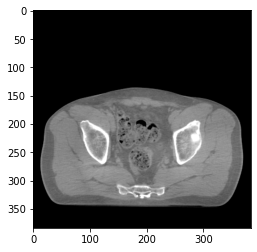

In [23]:
plt.imshow(x.squeeze(), 'gray'),

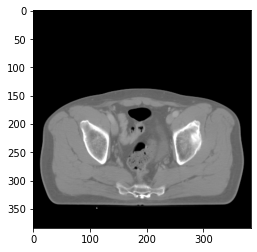

In [24]:
plt.imshow(y.squeeze(), 'gray')

In [25]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# training

In [26]:
import wandb

wandb.init(project="cbct_edge", config={
    "data": {
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "in_channels": GEN_IN_CHANNELS,
        "out_channels": GEN_N_CLASSES,
        "optimizer": GEN_OPTIM_NAME,
        "init_lr": GEN_init_lr,
        "momentum": GEN_momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": GEN_ACT,
        "decoder_attention_type": DECODER_ATT
    },
    "discriminator": {
        "in_channels": DIS_IN_CHANNELS,
        "out_channels": DIS_N_CLASSES,
        "optimizer": DIS_OPTIM_NAME,
        "init_lr": DIS_init_lr,
        "momentum": DIS_momentum,
        "encoder": "resnet152"
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)


In [27]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [28]:
import segmentation_models_pytorch as smp
import torchvision.models as models

model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [29]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [30]:
model

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [31]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
gen_optimizer = Optimizer(model.parameters(), name=GEN_OPTIM_NAME, lr=GEN_init_lr)
dis_optimizer = Optimizer(discriminator.parameters(), name=DIS_OPTIM_NAME, lr=DIS_init_lr)

In [32]:
wandb.watch(model)
wandb.watch(discriminator)

max_score = 0

for epoch in range(EPOCH):
        
        loss_gen, loss_dis = train_a2b_epoch(model, gen_optimizer, discriminator, dis_optimizer, trainloader, device)
        score_acc_train = eval_epoch(model, discriminator, trainloader, device)
        score_acc_test = eval_epoch(model, discriminator, testloader, device)

        
        wandb.log({
            "loss gen": loss_gen,
            "loss dis": loss_dis,
            "trainset acc score": score_acc_train,
            "testset acc score": score_acc_test
        })
        
        
        if score_acc_test  >  max_score:
            max_score = score_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": gen_optimizer.state_dict(),
                "dicriminator": discriminator.state_dict(),
                "dis_optim": dis_optimizer.state_dict()
            }
            torch.save(checkpoint, os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

84it [01:01,  1.38it/s]
84it [00:38,  2.17it/s]
12it [00:05,  2.29it/s]
84it [00:57,  1.46it/s]
84it [00:38,  2.21it/s]
12it [00:05,  2.29it/s]
84it [00:59,  1.42it/s]
84it [00:38,  2.20it/s]
12it [00:05,  2.29it/s]
84it [00:59,  1.42it/s]
84it [00:39,  2.15it/s]
12it [00:05,  2.28it/s]
84it [00:59,  1.42it/s]
84it [00:38,  2.18it/s]
12it [00:05,  2.28it/s]
84it [00:59,  1.41it/s]
84it [00:38,  2.17it/s]
12it [00:05,  2.28it/s]
84it [00:58,  1.43it/s]
84it [00:38,  2.18it/s]
12it [00:05,  2.28it/s]
84it [00:59,  1.42it/s]
84it [00:38,  2.16it/s]
12it [00:05,  2.26it/s]
84it [00:59,  1.41it/s]
84it [00:39,  2.14it/s]
12it [00:05,  2.27it/s]
84it [01:00,  1.40it/s]
84it [00:39,  2.15it/s]
12it [00:05,  2.28it/s]
84it [00:59,  1.40it/s]
84it [00:39,  2.13it/s]
12it [00:05,  2.28it/s]
84it [00:59,  1.42it/s]
84it [00:38,  2.18it/s]
12it [00:05,  2.27it/s]
84it [00:59,  1.41it/s]
84it [00:39,  2.14it/s]
12it [00:05,  2.22it/s]
84it [00:59,  1.40it/s]
84it [00:39,  2.15it/s]
12it [00:05,  2.

In [33]:
checkpoint = torch.load(os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

In [34]:
model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [35]:
dir_path = os.path.join("eval-edge", wandb.run.name)
try:
    os.mkdir(dir_path)
except FileExistsError:
    pass

0it [00:00, ?it/s]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582995414734
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


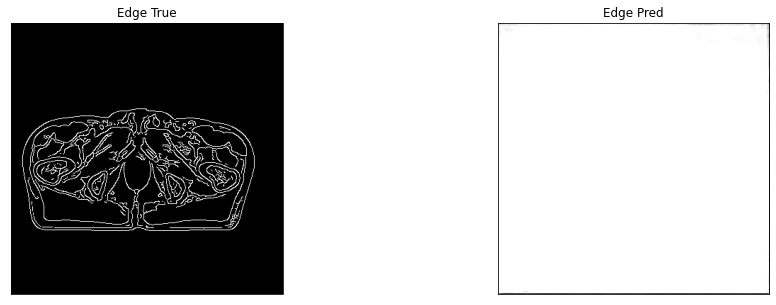

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


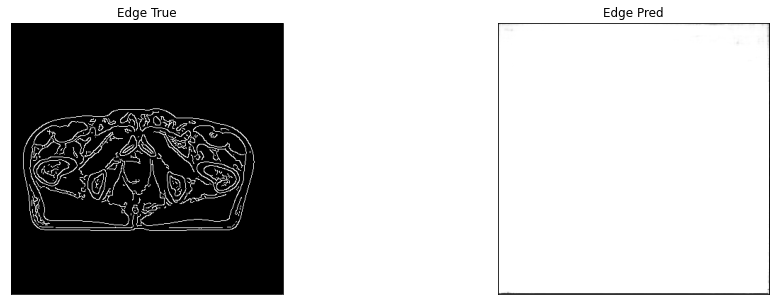

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0047, device='cuda:0') tensor(1., device='cuda:0')


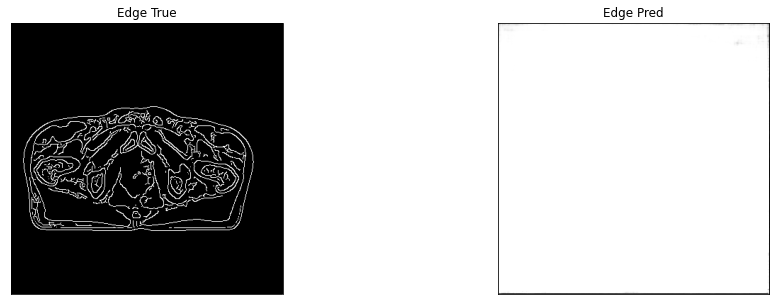

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


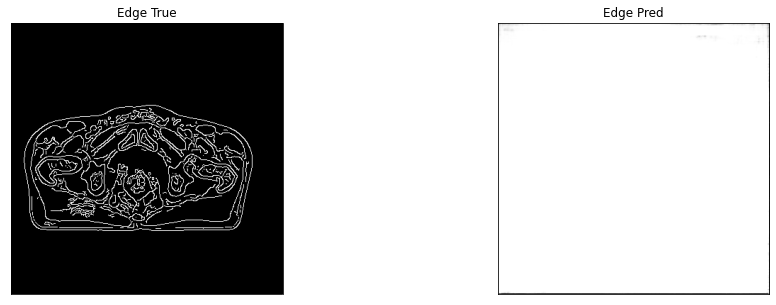

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


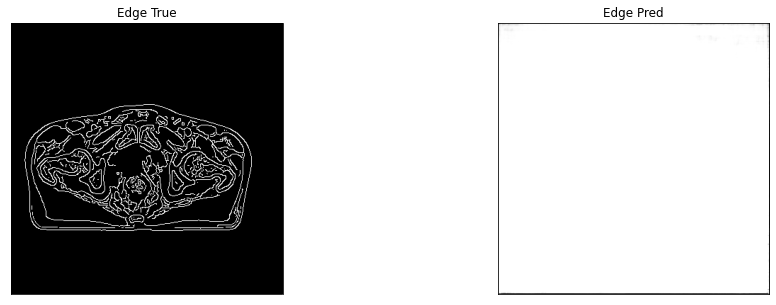

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582995414734
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0027, device='cuda:0') tensor(1., device='cuda:0')


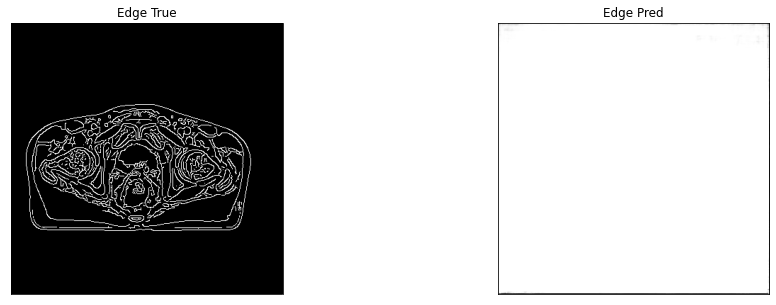

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582995414734
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


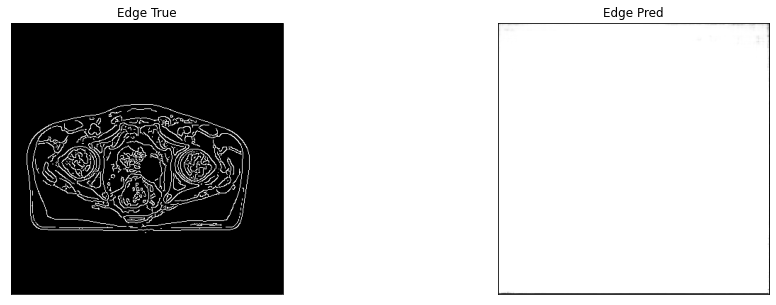

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


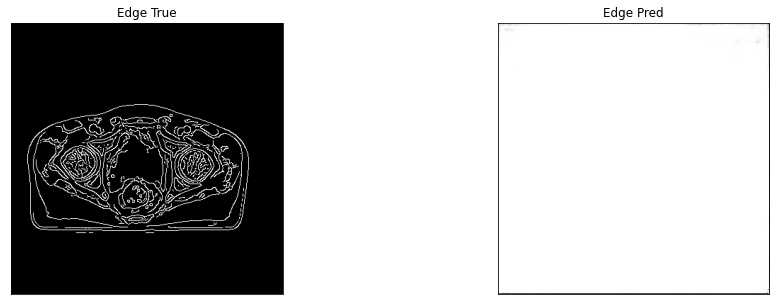

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


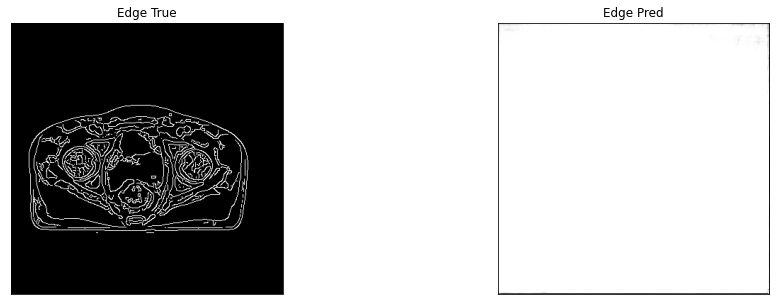

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582995414734
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0048, device='cuda:0') tensor(1., device='cuda:0')


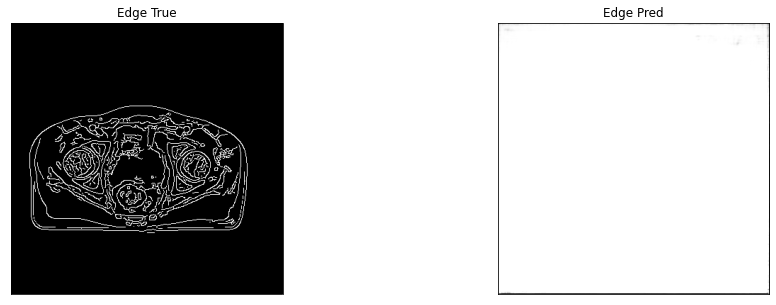

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0069, device='cuda:0') tensor(1., device='cuda:0')


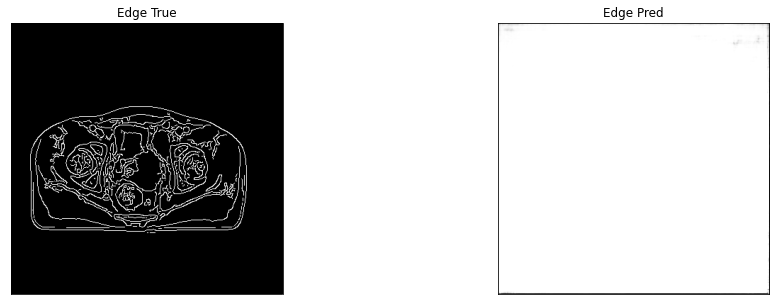

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


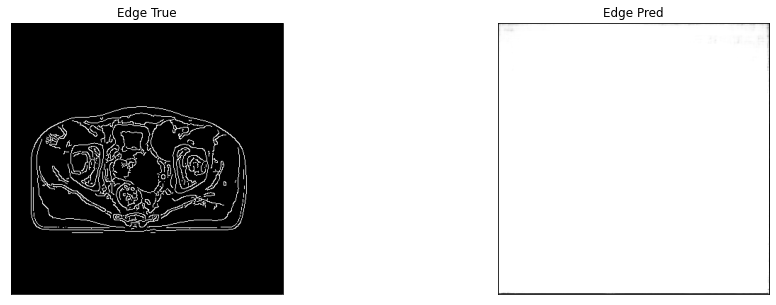

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0059, device='cuda:0') tensor(1., device='cuda:0')


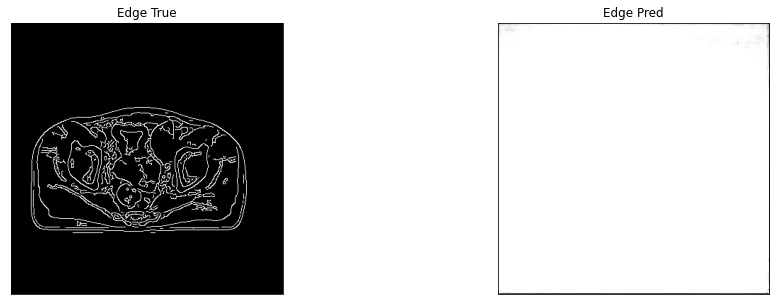

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581803321838
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


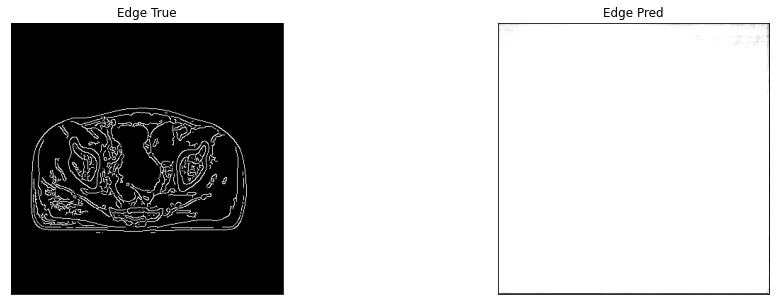

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310582399368286
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0045, device='cuda:0') tensor(1., device='cuda:0')


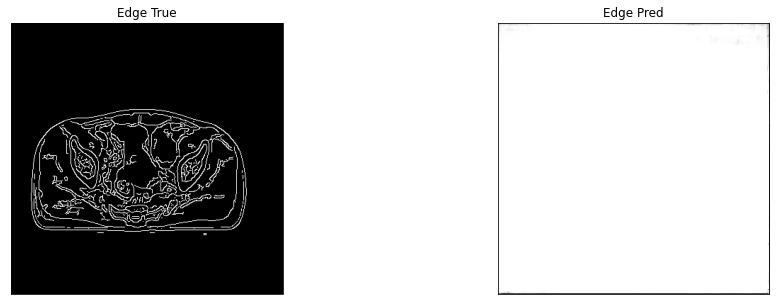

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581803321838
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0049, device='cuda:0') tensor(1., device='cuda:0')


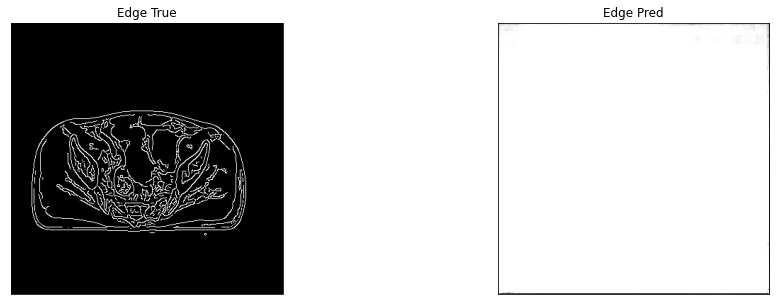

1it [00:03,  3.10s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0066, device='cuda:0') tensor(1., device='cuda:0')


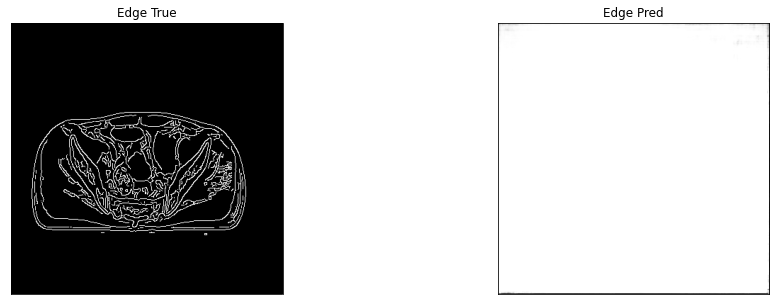

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581803321838
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


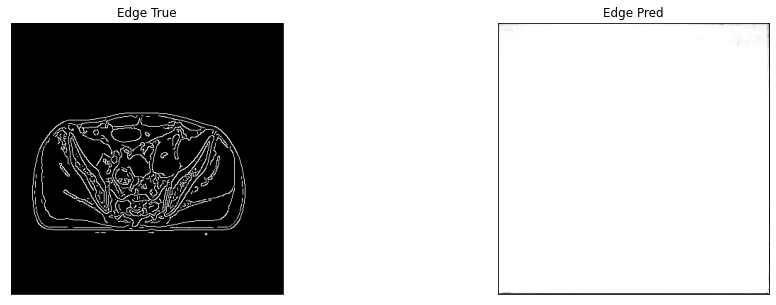

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581803321838
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0049, device='cuda:0') tensor(1., device='cuda:0')


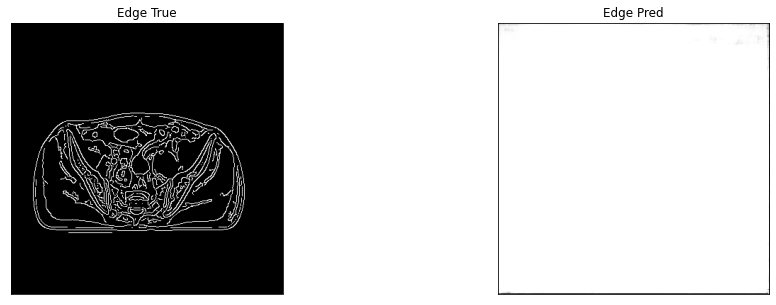

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


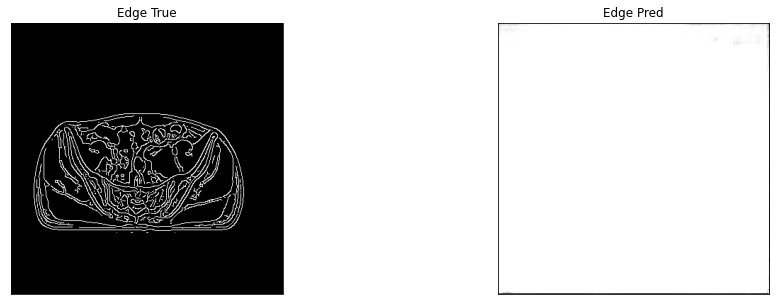

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


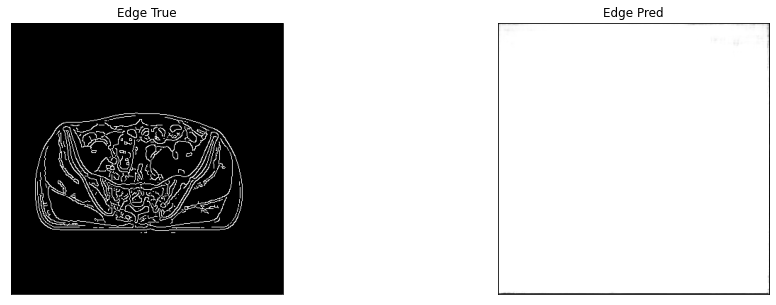

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


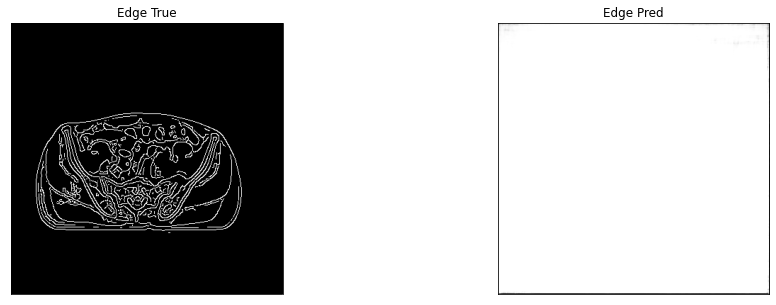

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0066, device='cuda:0') tensor(1., device='cuda:0')


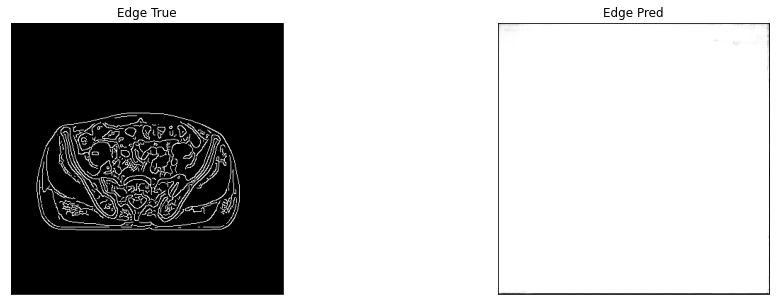

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


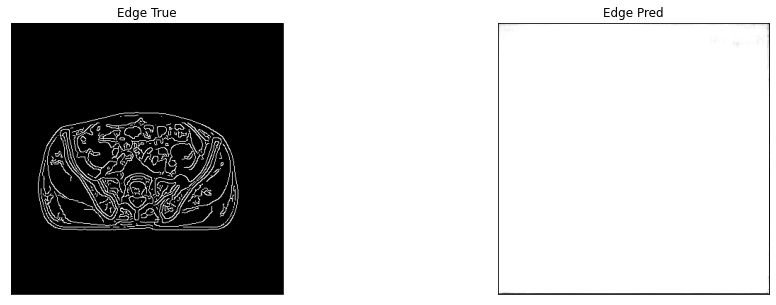

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0027, device='cuda:0') tensor(1., device='cuda:0')


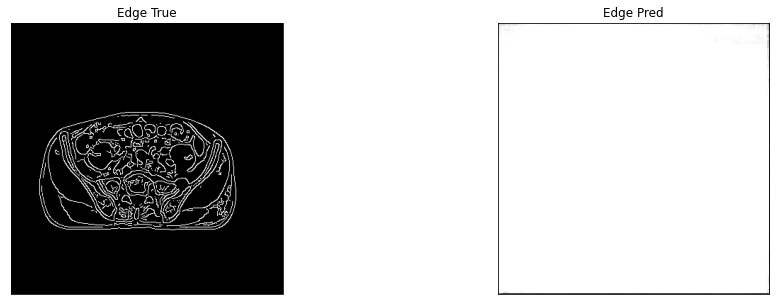

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0048, device='cuda:0') tensor(1., device='cuda:0')


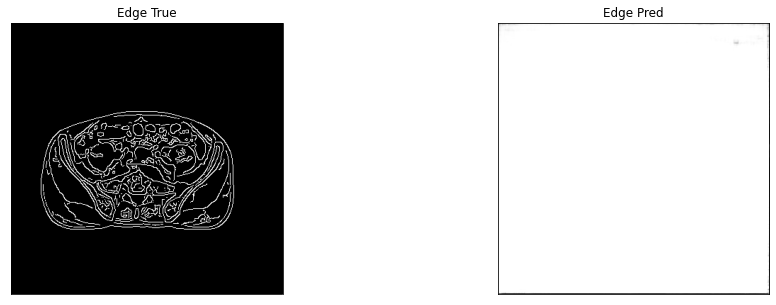

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


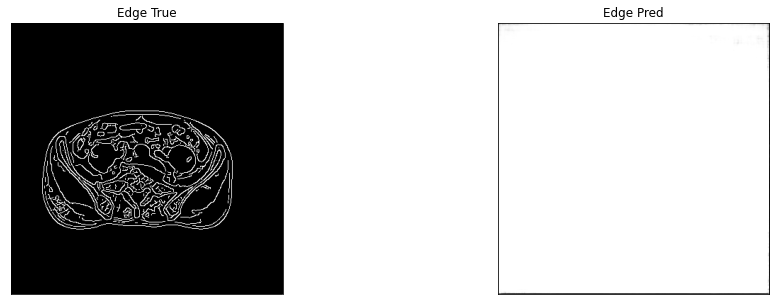

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310581207275391
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0068, device='cuda:0') tensor(1., device='cuda:0')


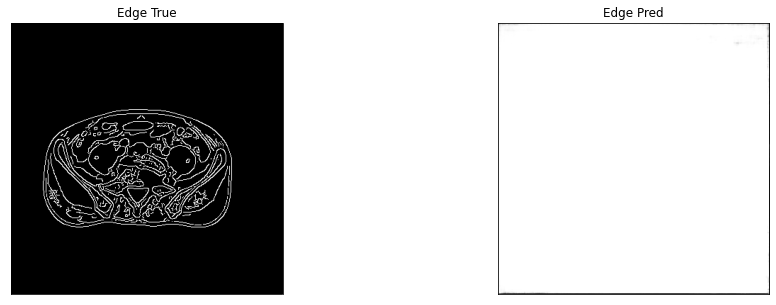

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.4503e-05, device='cuda:0') tensor(1., device='cuda:0')


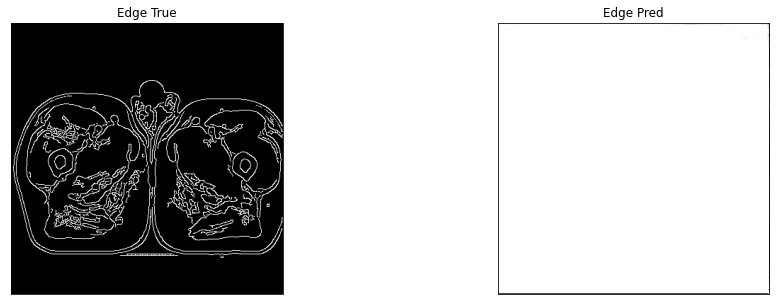

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.2566e-05, device='cuda:0') tensor(1., device='cuda:0')


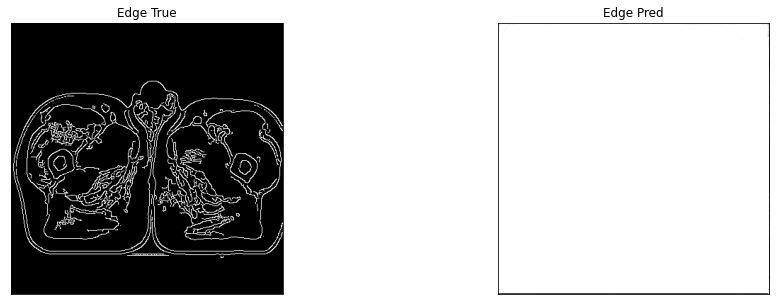

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5022e-05, device='cuda:0') tensor(1., device='cuda:0')


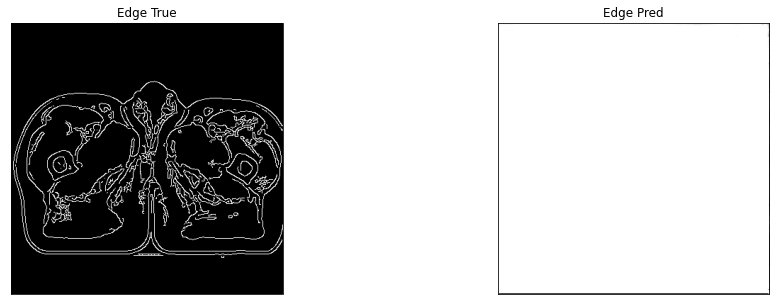

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.8657e-05, device='cuda:0') tensor(1., device='cuda:0')


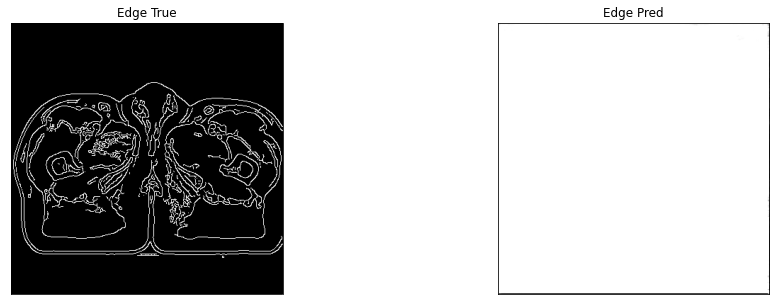

2it [00:05,  2.89s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.0863e-05, device='cuda:0') tensor(1., device='cuda:0')


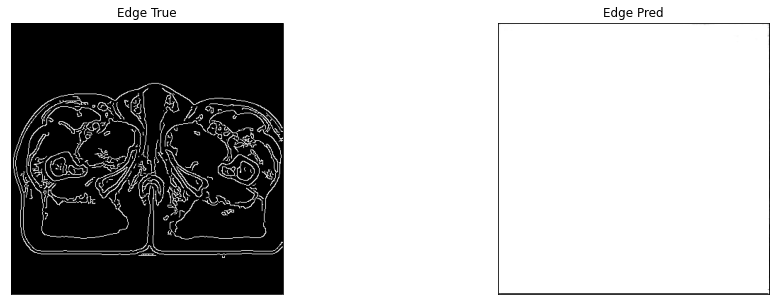

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.7829e-05, device='cuda:0') tensor(1., device='cuda:0')


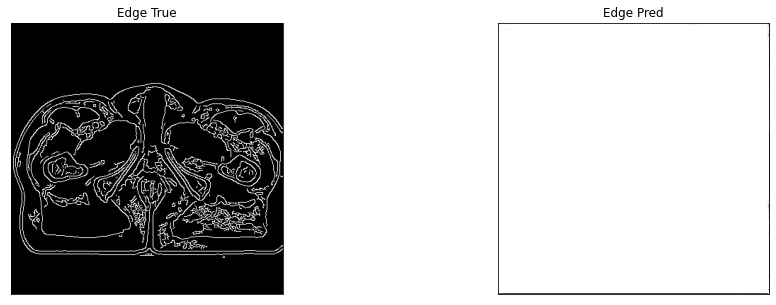

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.6297e-06, device='cuda:0') tensor(1., device='cuda:0')


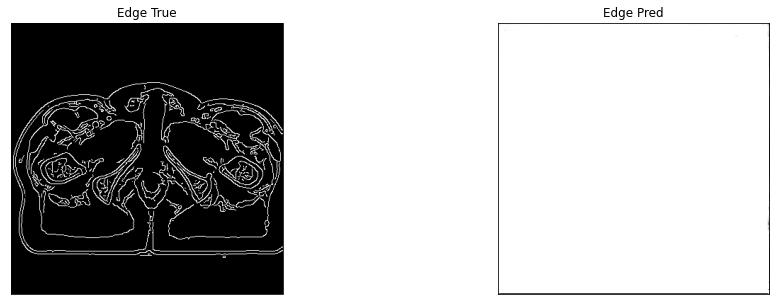

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.4485e-05, device='cuda:0') tensor(1., device='cuda:0')


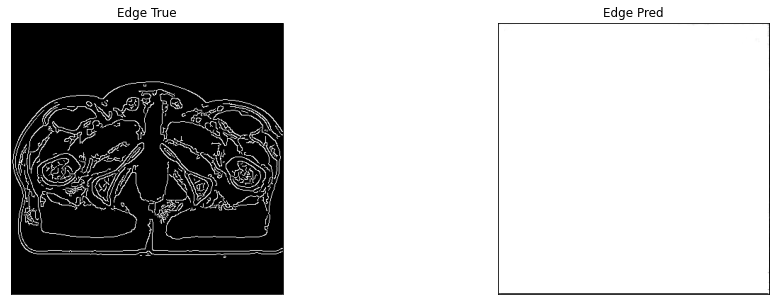

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.2889e-05, device='cuda:0') tensor(1., device='cuda:0')


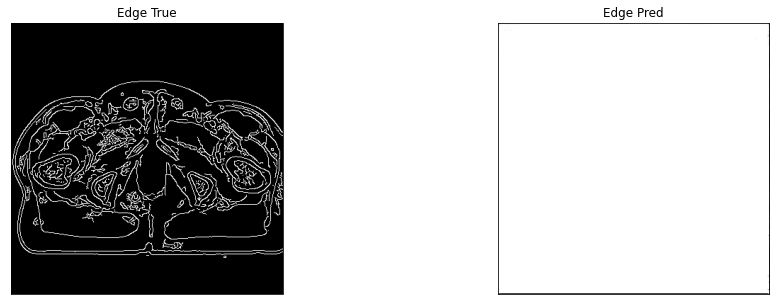

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.7672e-05, device='cuda:0') tensor(1., device='cuda:0')


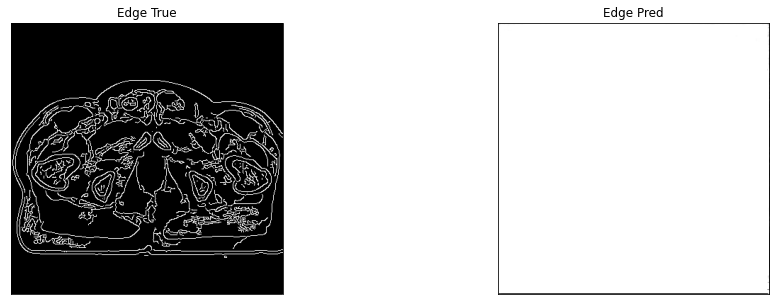

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.1031e-05, device='cuda:0') tensor(1., device='cuda:0')


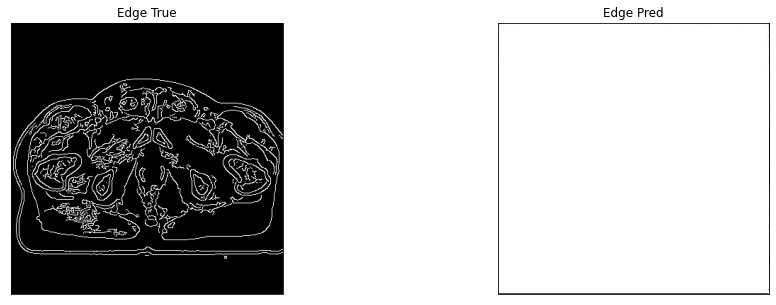

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.8186e-05, device='cuda:0') tensor(1., device='cuda:0')


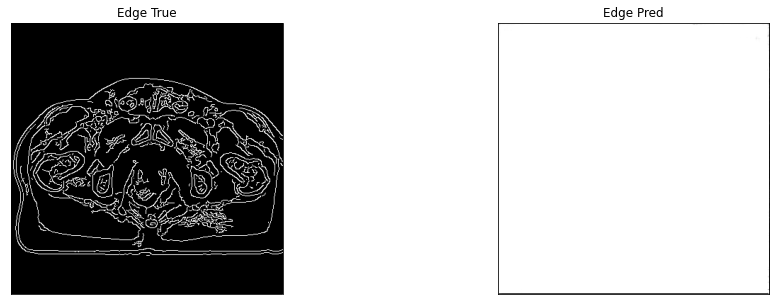

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.8833e-06, device='cuda:0') tensor(1., device='cuda:0')


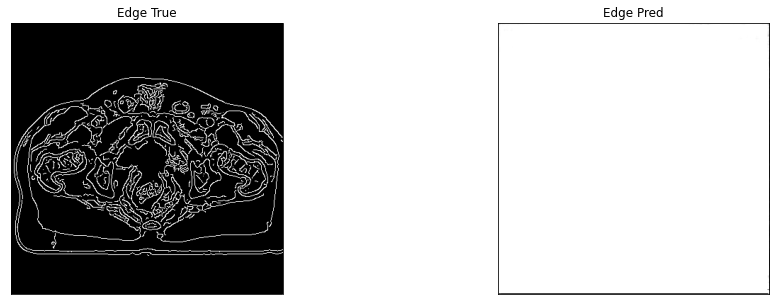

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.4696e-05, device='cuda:0') tensor(1., device='cuda:0')


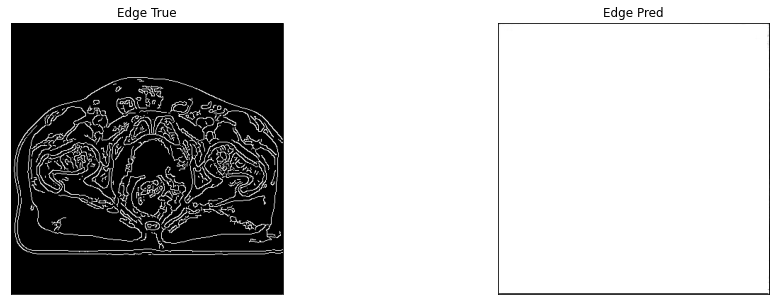

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3438e-05, device='cuda:0') tensor(1., device='cuda:0')


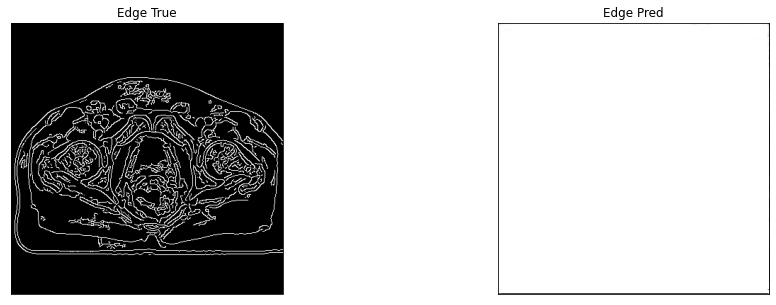

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6035e-05, device='cuda:0') tensor(1., device='cuda:0')


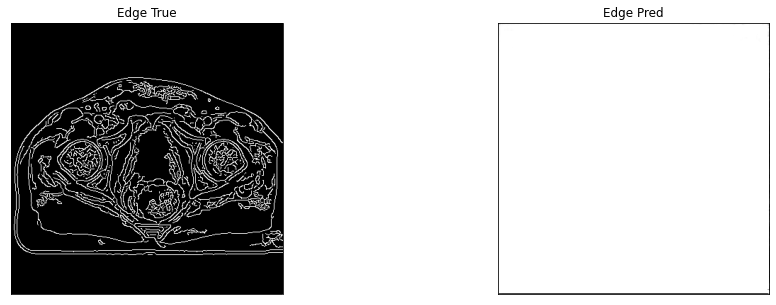

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1208e-05, device='cuda:0') tensor(1., device='cuda:0')


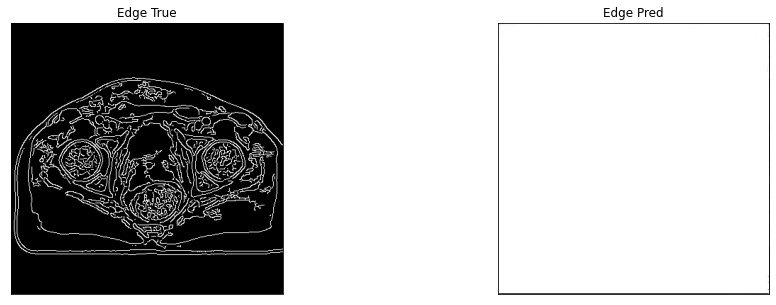

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.8635e-05, device='cuda:0') tensor(1., device='cuda:0')


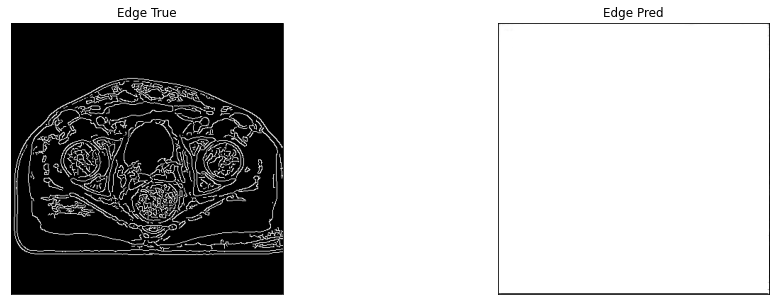

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.0228e-05, device='cuda:0') tensor(1., device='cuda:0')


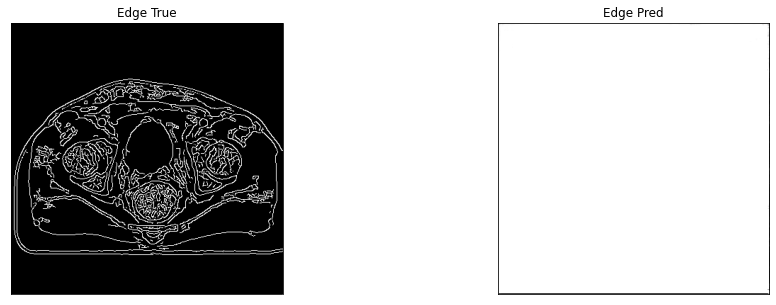

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6517e-05, device='cuda:0') tensor(1., device='cuda:0')


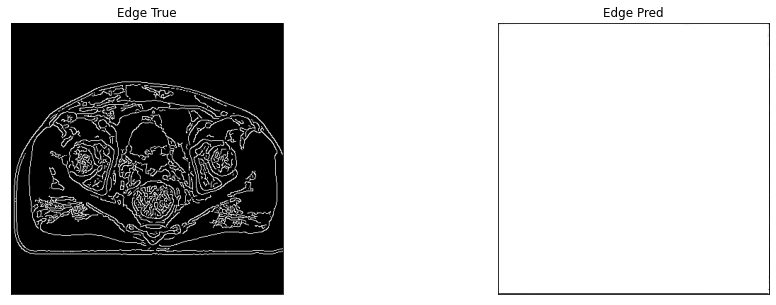

3it [00:07,  2.69s/it]

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.3608e-05, device='cuda:0') tensor(1., device='cuda:0')


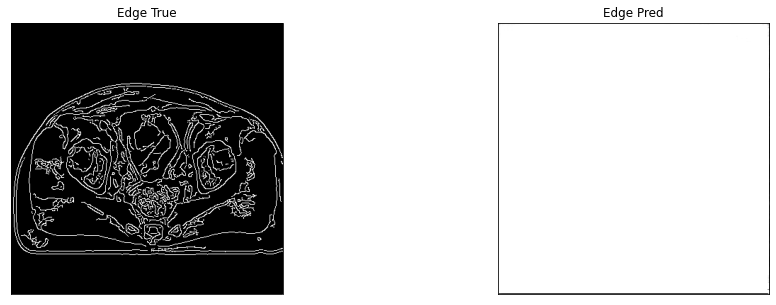

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.0696e-06, device='cuda:0') tensor(1., device='cuda:0')


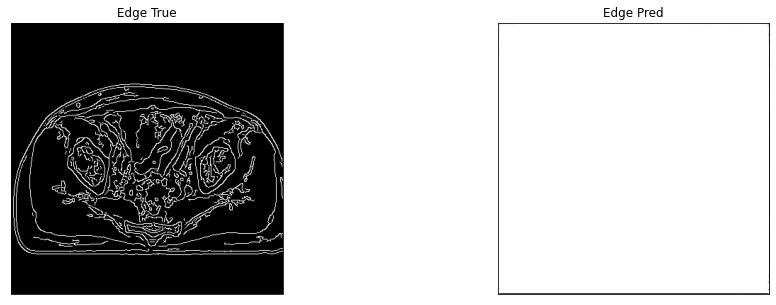

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2628e-05, device='cuda:0') tensor(1., device='cuda:0')


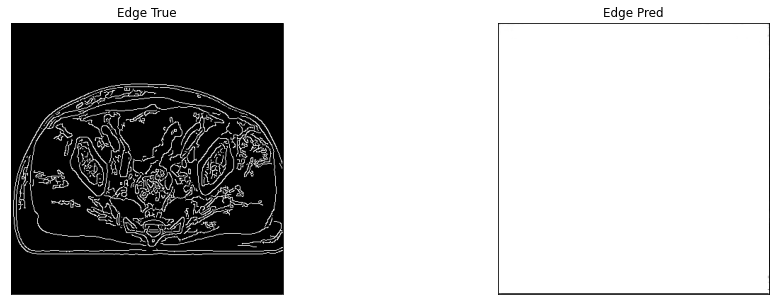

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.7990e-05, device='cuda:0') tensor(1., device='cuda:0')


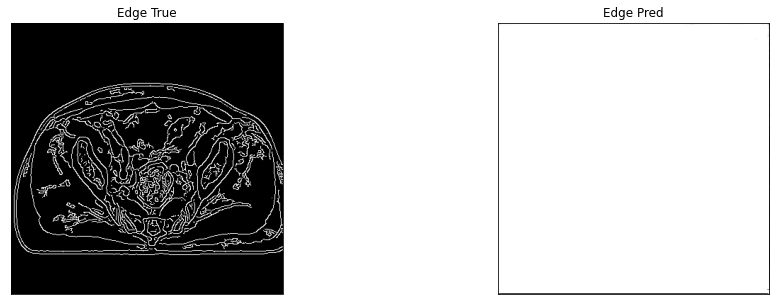

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.3095e-05, device='cuda:0') tensor(1., device='cuda:0')


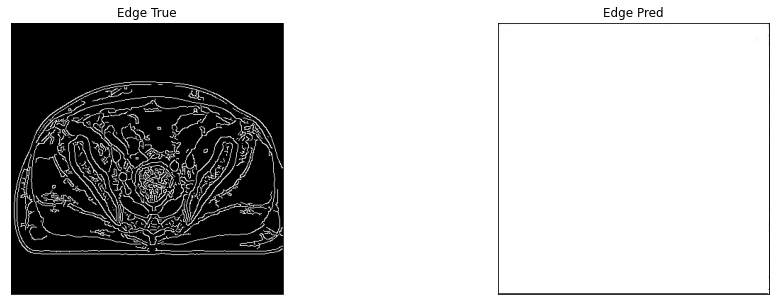

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9697e-05, device='cuda:0') tensor(1., device='cuda:0')


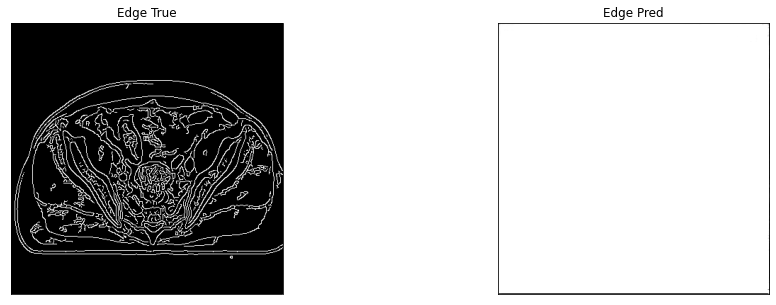

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.1803e-05, device='cuda:0') tensor(1., device='cuda:0')


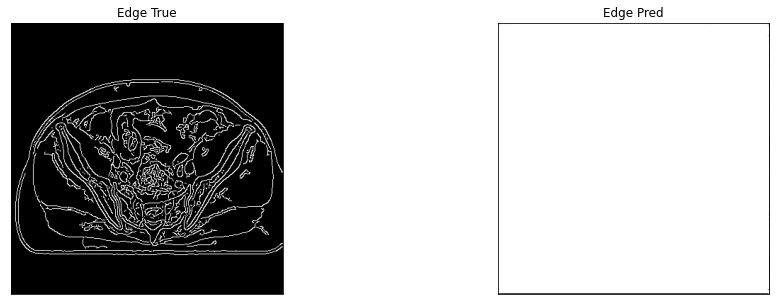

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


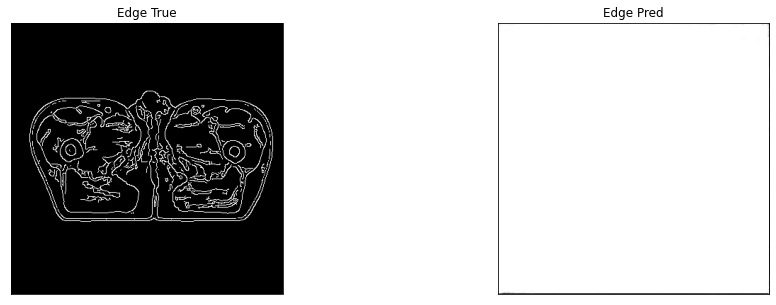

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


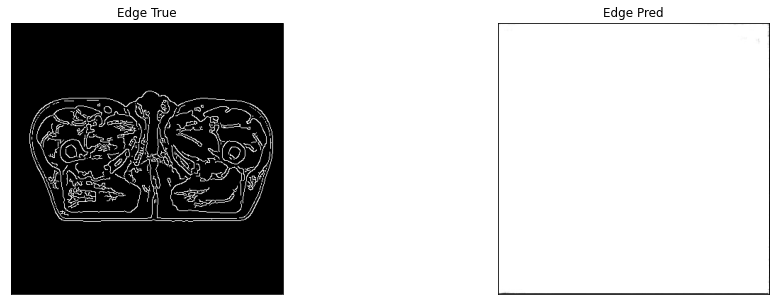

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


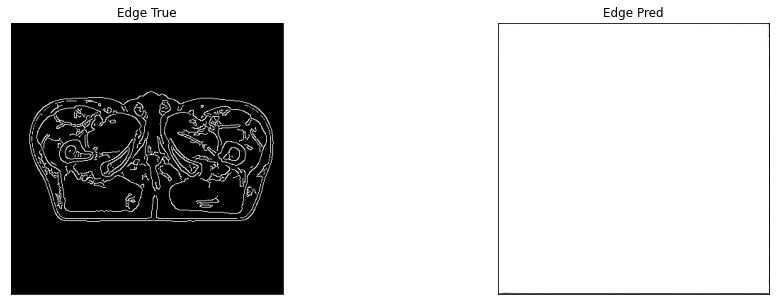

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


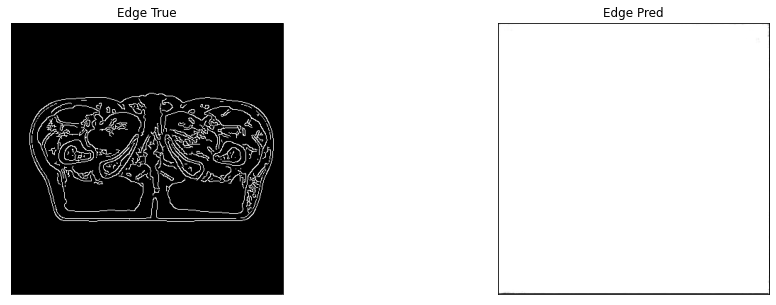

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0064, device='cuda:0') tensor(1., device='cuda:0')


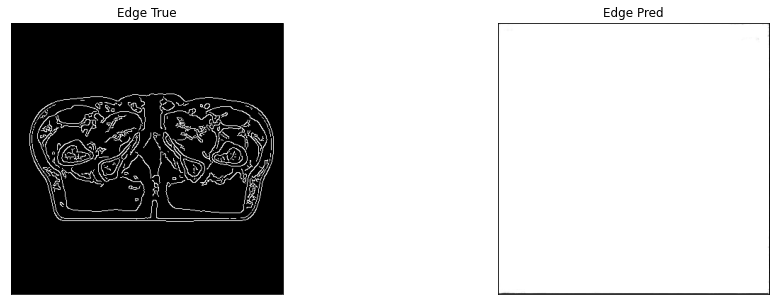

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


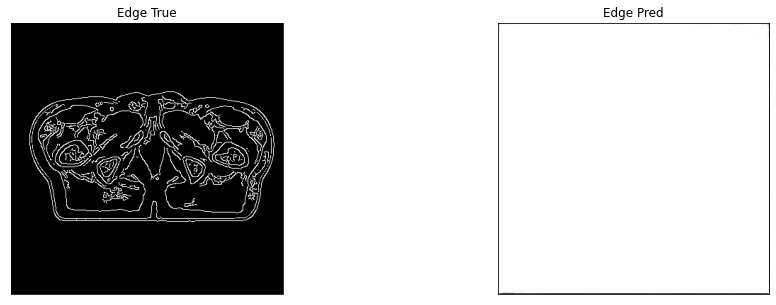

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0051, device='cuda:0') tensor(1., device='cuda:0')


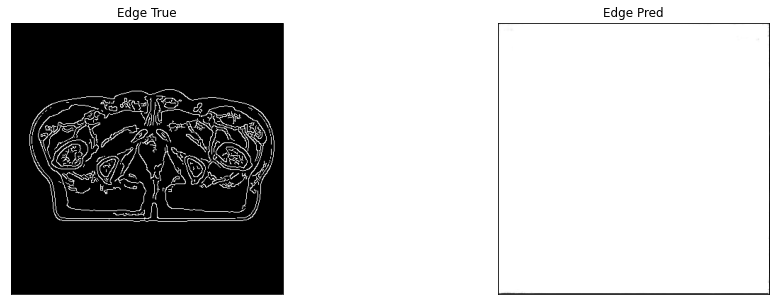

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


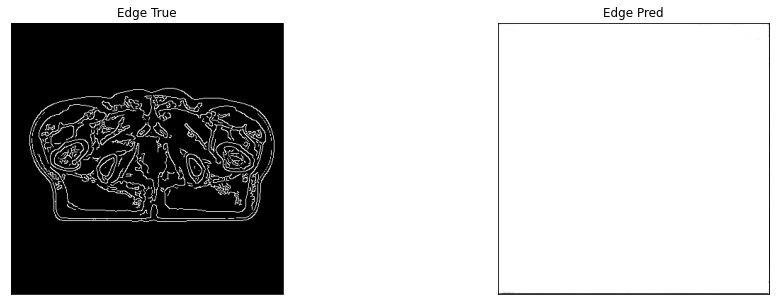

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0022, device='cuda:0') tensor(1., device='cuda:0')


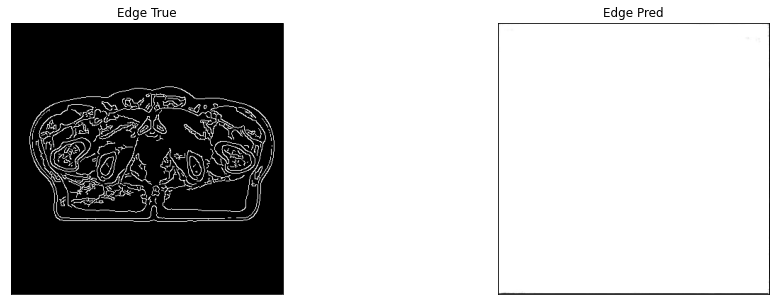

4it [00:09,  2.52s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0045, device='cuda:0') tensor(1., device='cuda:0')


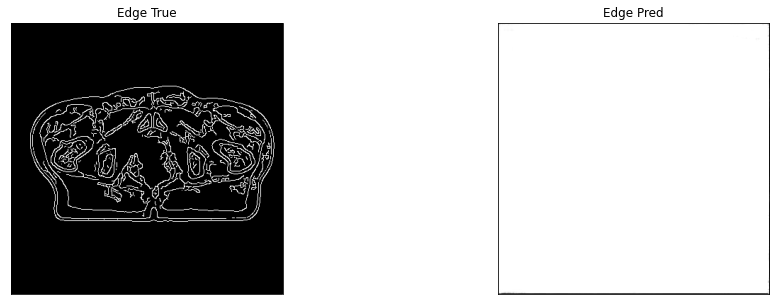

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


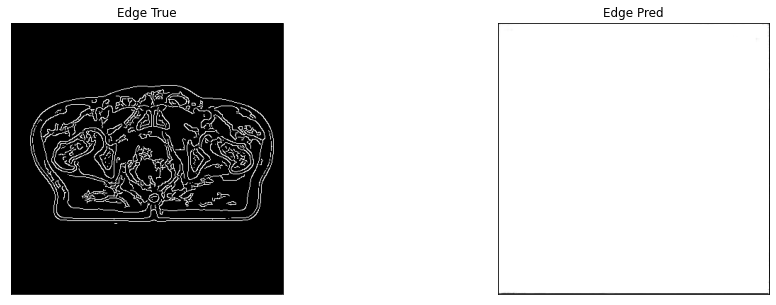

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


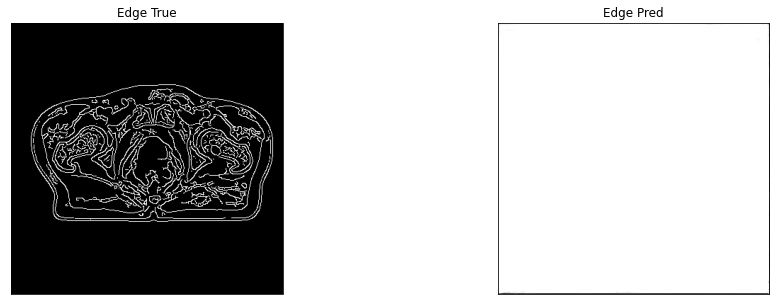

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


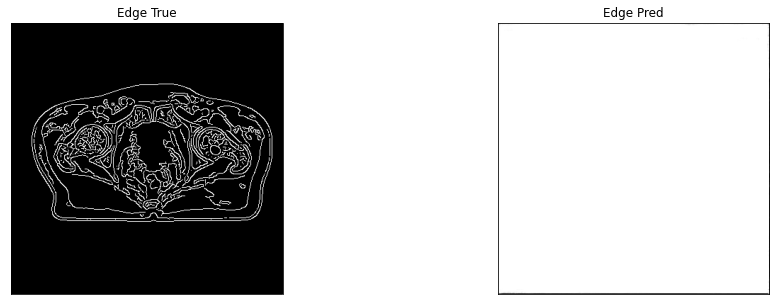

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


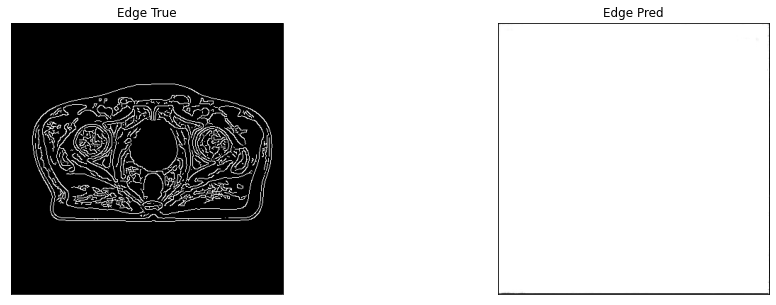

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


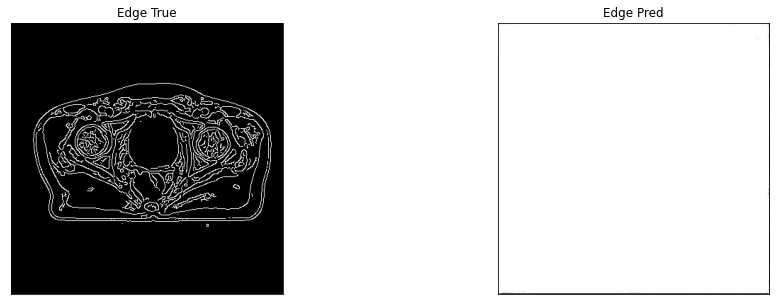

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


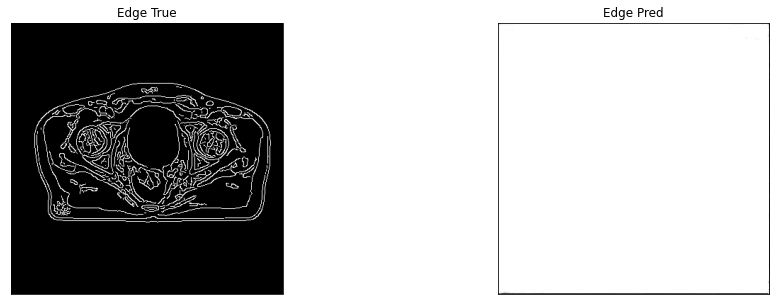

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0049, device='cuda:0') tensor(1., device='cuda:0')


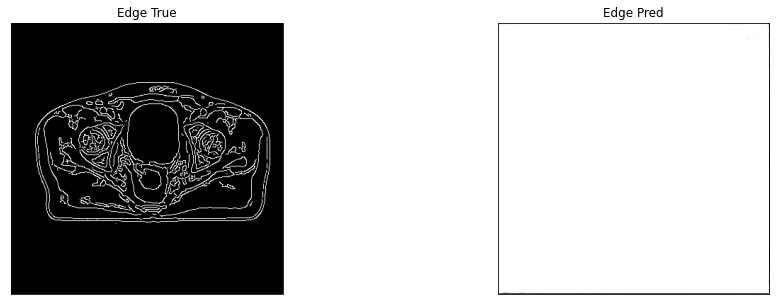

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


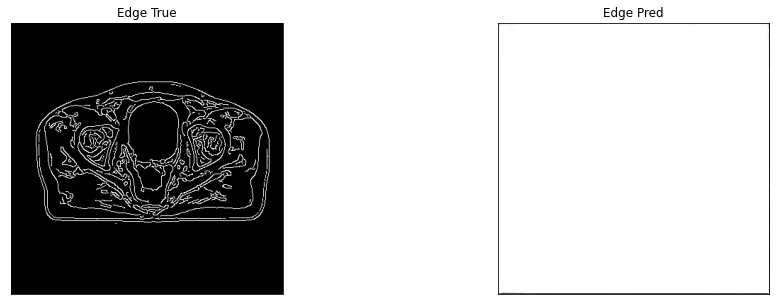

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


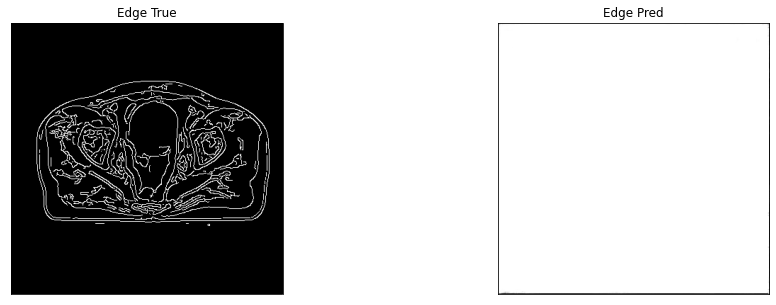

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310583591461182
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


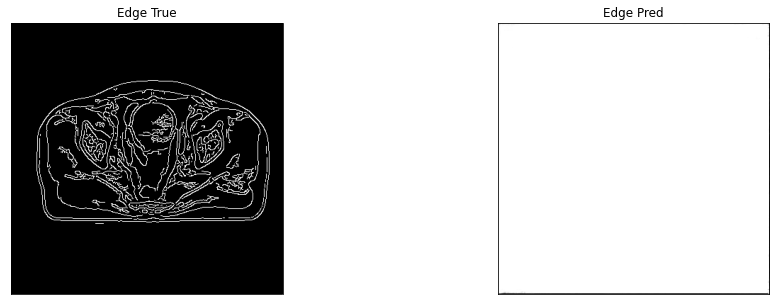

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0041, device='cuda:0') tensor(1., device='cuda:0')


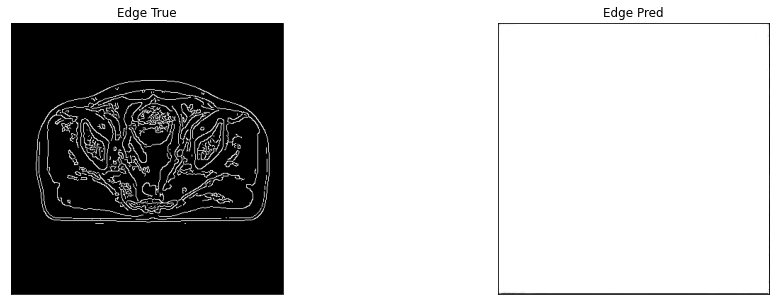

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0024, device='cuda:0') tensor(1., device='cuda:0')


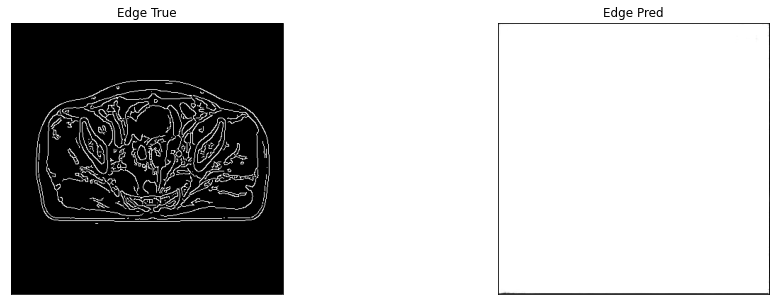

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0016, device='cuda:0') tensor(1., device='cuda:0')


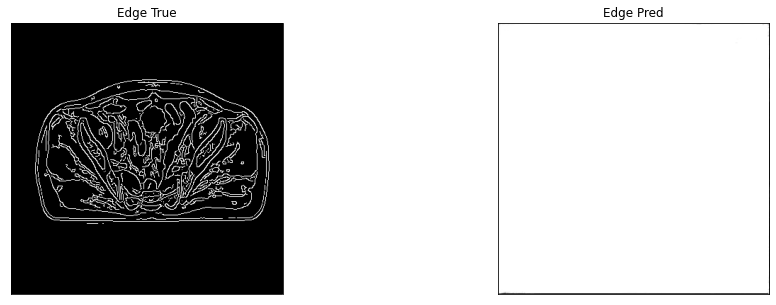

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


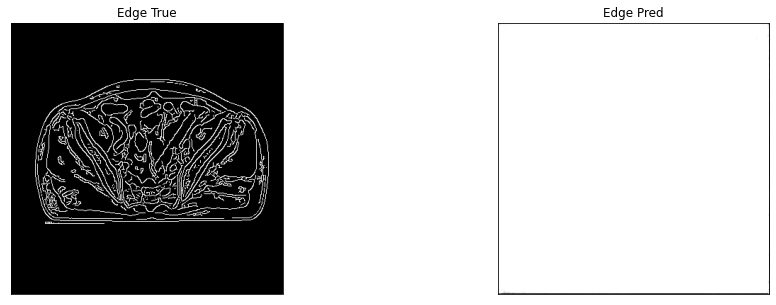

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0029, device='cuda:0') tensor(1., device='cuda:0')


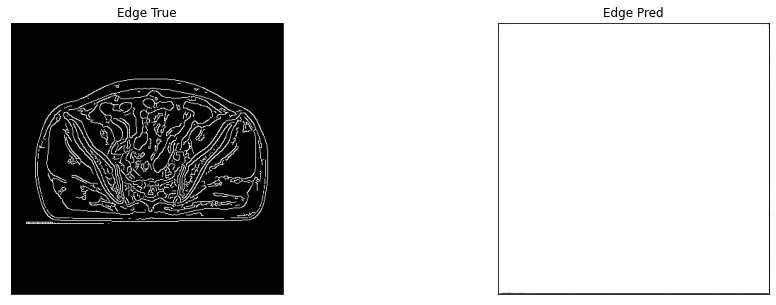

5it [00:12,  2.47s/it]

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


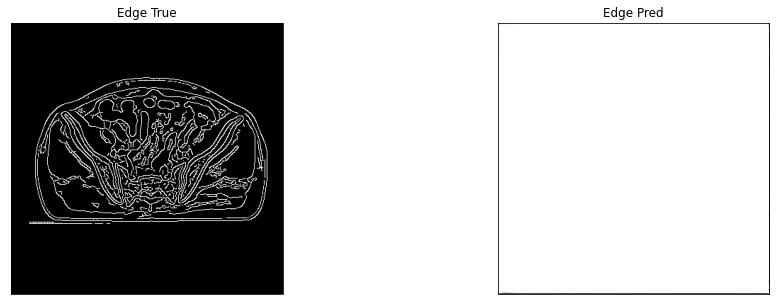

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.3424e-06, device='cuda:0') tensor(1., device='cuda:0')


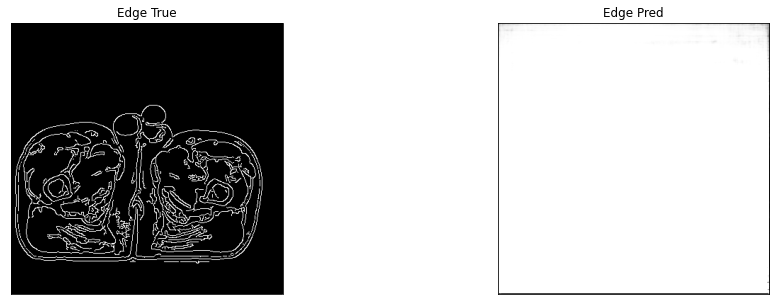

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.9545e-06, device='cuda:0') tensor(1., device='cuda:0')


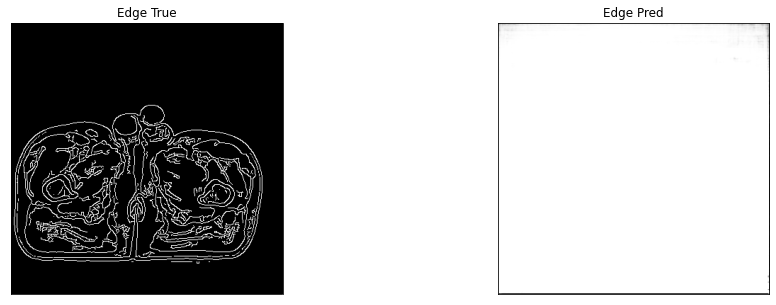

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2276e-05, device='cuda:0') tensor(1., device='cuda:0')


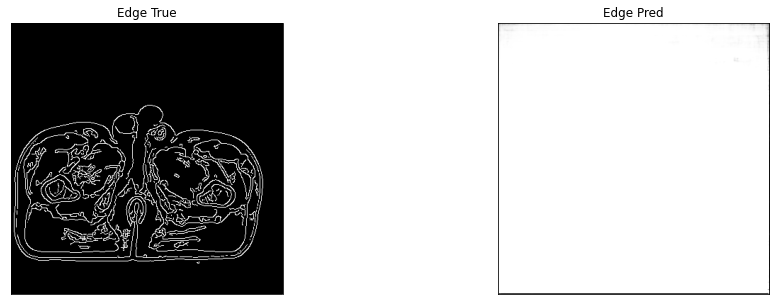

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.3237e-06, device='cuda:0') tensor(1., device='cuda:0')


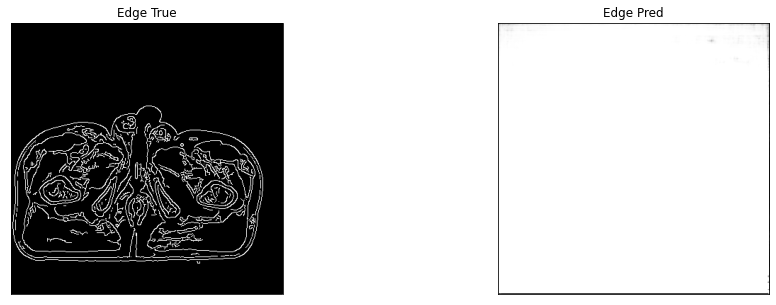

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.3127e-06, device='cuda:0') tensor(1., device='cuda:0')


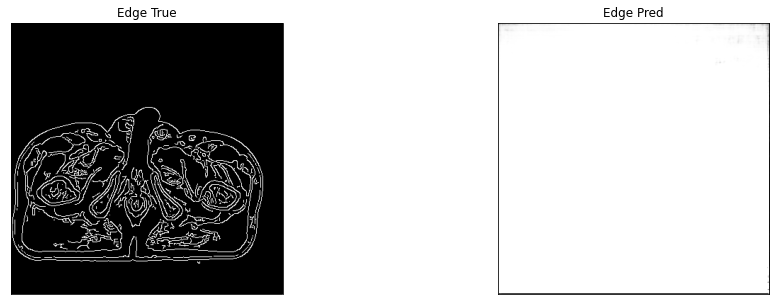

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.0292e-06, device='cuda:0') tensor(1., device='cuda:0')


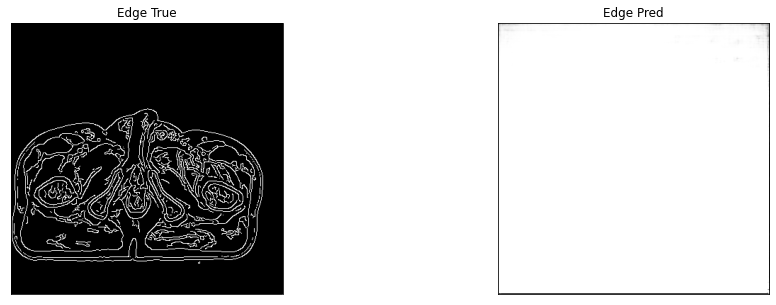

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.6011e-06, device='cuda:0') tensor(1., device='cuda:0')


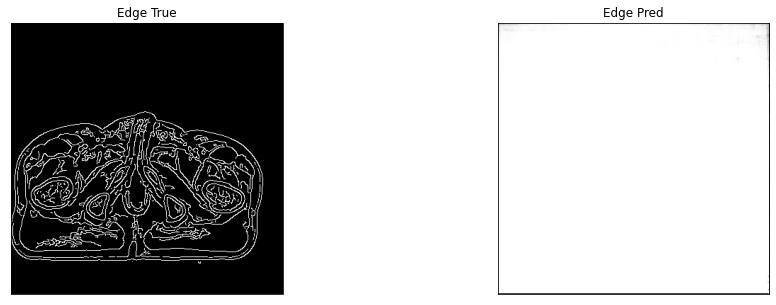

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1062e-05, device='cuda:0') tensor(1., device='cuda:0')


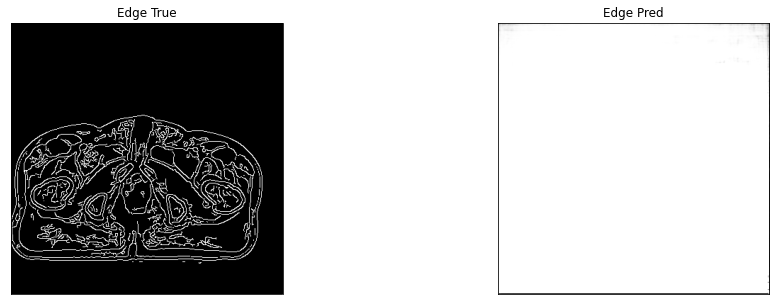

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.2571e-06, device='cuda:0') tensor(1., device='cuda:0')


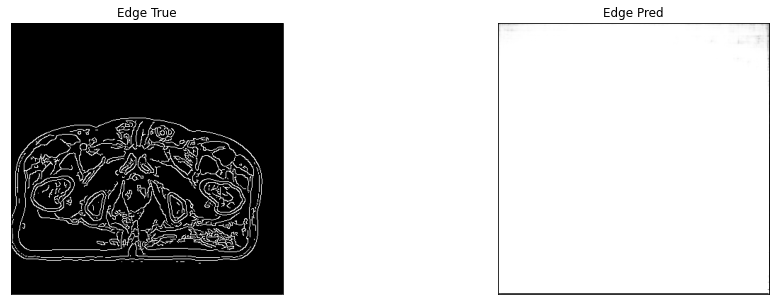

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5274e-05, device='cuda:0') tensor(1., device='cuda:0')


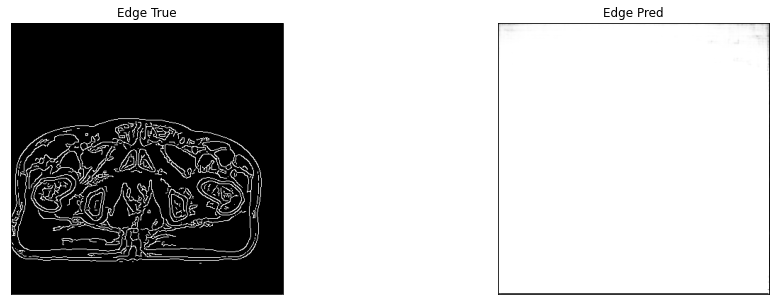

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1636e-05, device='cuda:0') tensor(1., device='cuda:0')


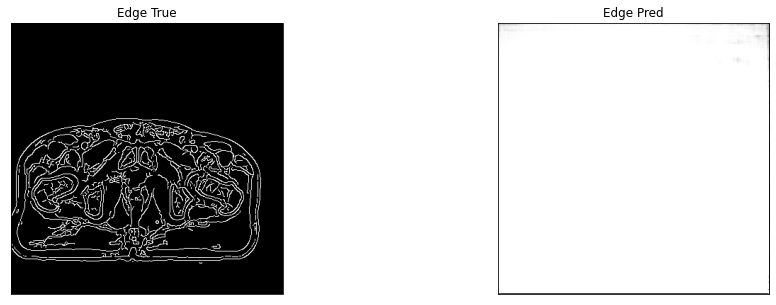

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.9127e-06, device='cuda:0') tensor(1., device='cuda:0')


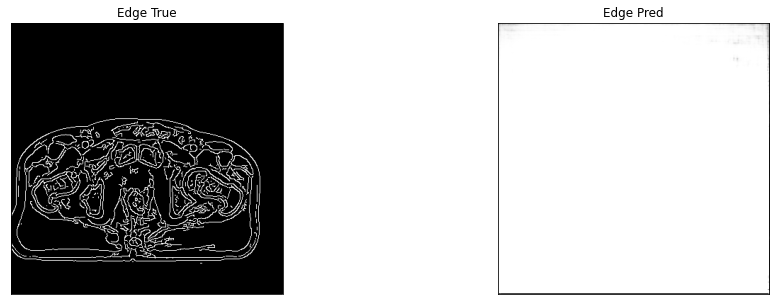

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.0280e-06, device='cuda:0') tensor(1., device='cuda:0')


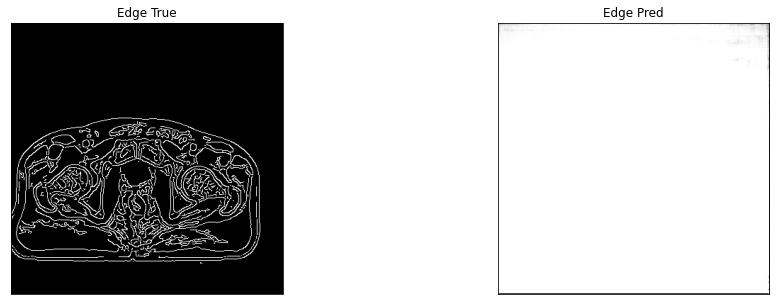

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3490e-05, device='cuda:0') tensor(1., device='cuda:0')


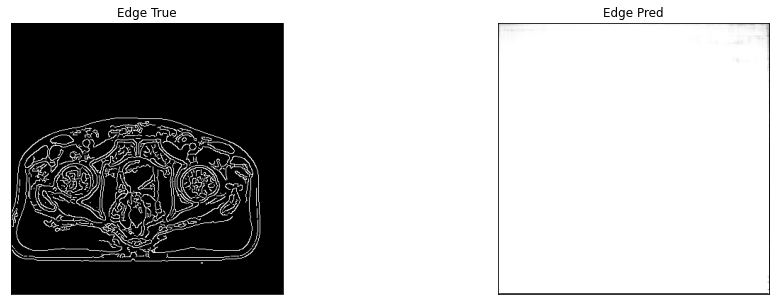

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9472e-05, device='cuda:0') tensor(1., device='cuda:0')


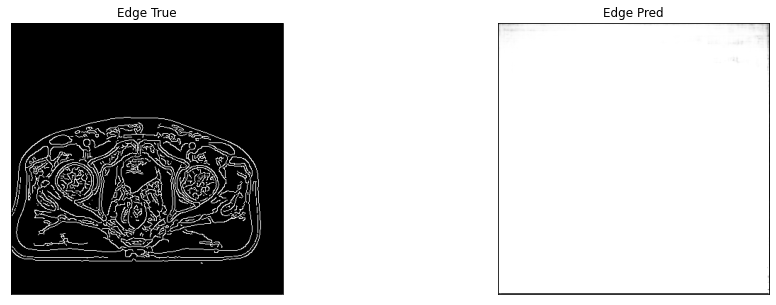

6it [00:14,  2.38s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.2930e-06, device='cuda:0') tensor(1., device='cuda:0')


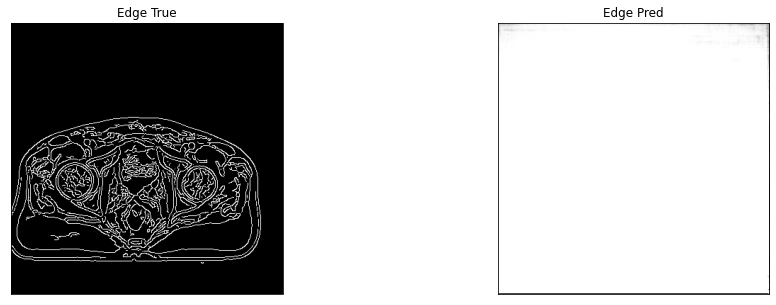

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.1788e-06, device='cuda:0') tensor(1., device='cuda:0')


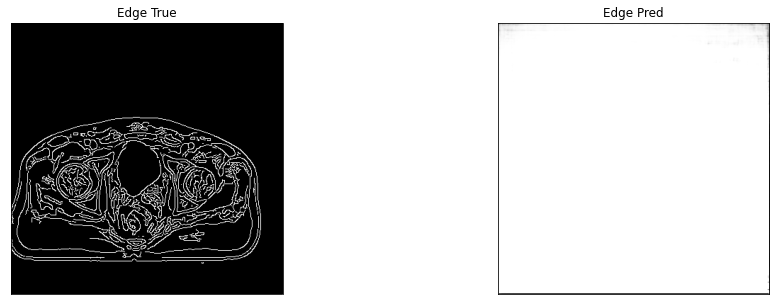

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0159e-05, device='cuda:0') tensor(1., device='cuda:0')


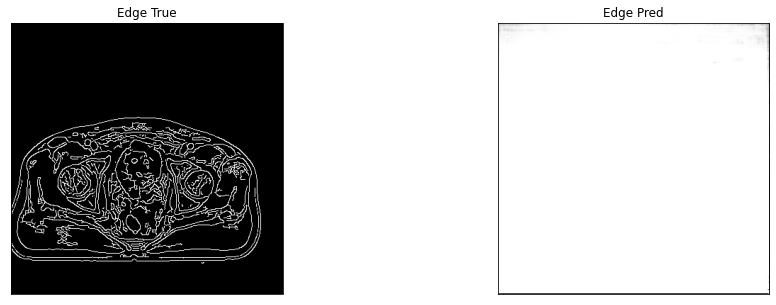

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.1824e-06, device='cuda:0') tensor(1., device='cuda:0')


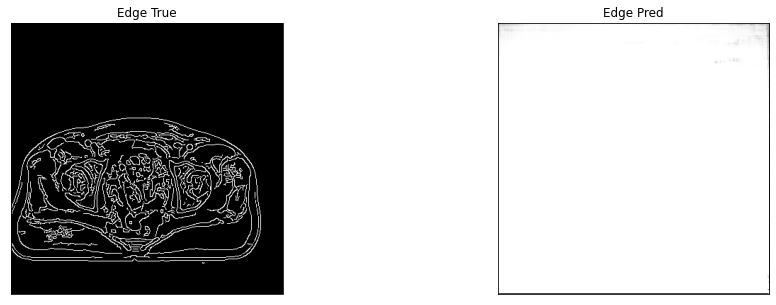

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.5697e-06, device='cuda:0') tensor(1., device='cuda:0')


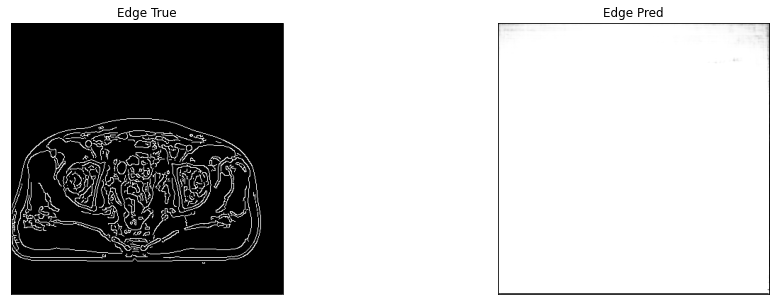

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0208e-05, device='cuda:0') tensor(1., device='cuda:0')


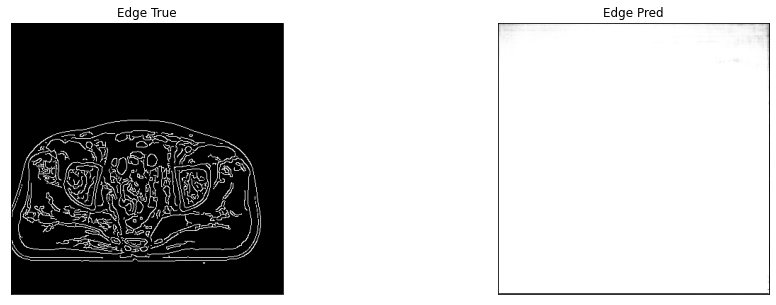

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.6722e-06, device='cuda:0') tensor(1., device='cuda:0')


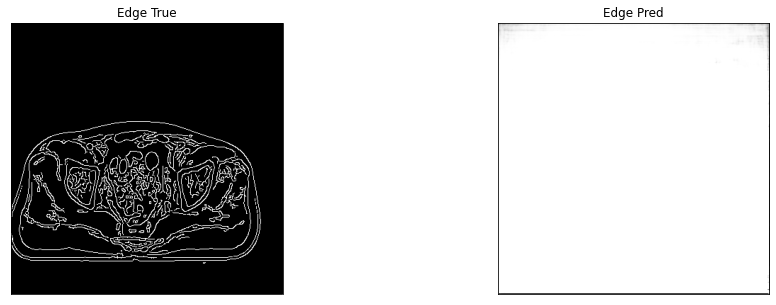

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5072e-05, device='cuda:0') tensor(1., device='cuda:0')


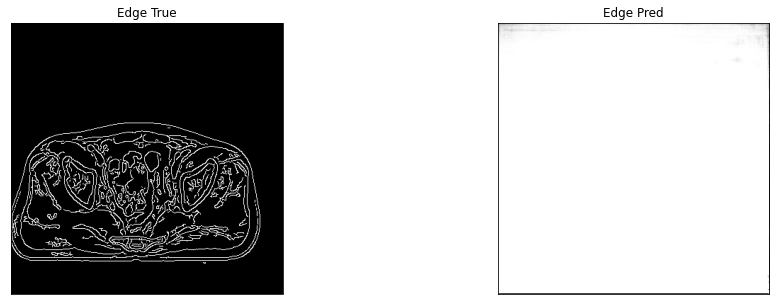

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.1139e-06, device='cuda:0') tensor(1., device='cuda:0')


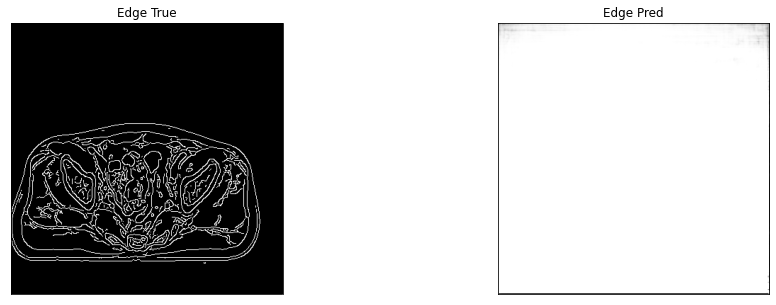

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3392e-06, device='cuda:0') tensor(1., device='cuda:0')


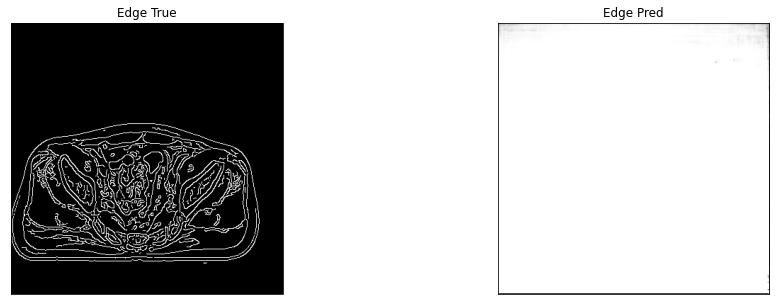

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.4463e-06, device='cuda:0') tensor(1., device='cuda:0')


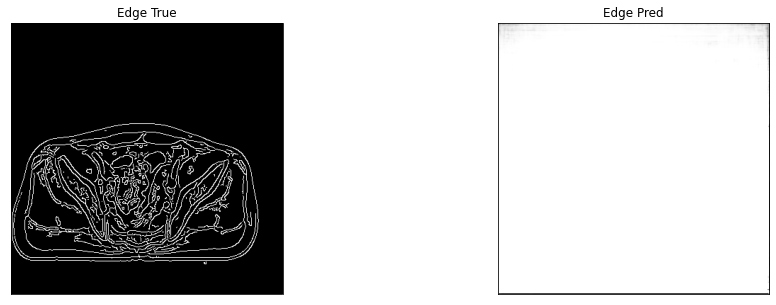

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.4761e-06, device='cuda:0') tensor(1., device='cuda:0')


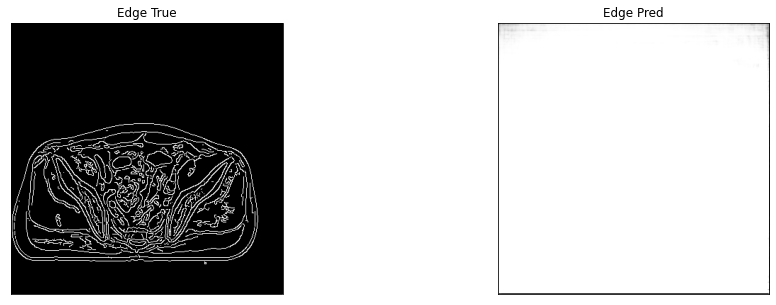

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.8657e-06, device='cuda:0') tensor(1., device='cuda:0')


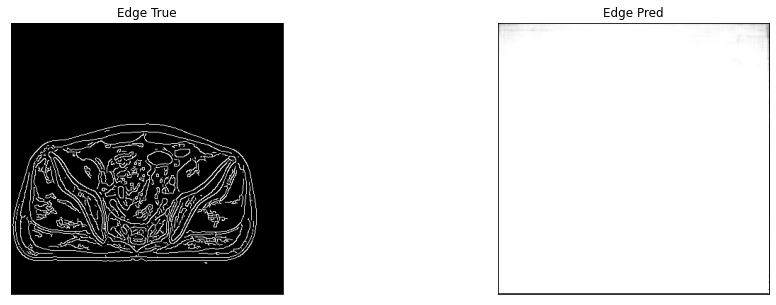

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


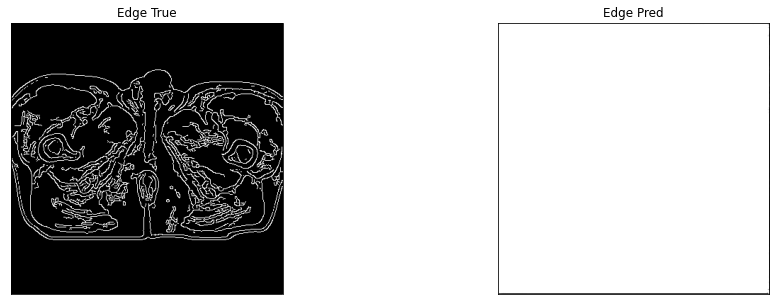

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


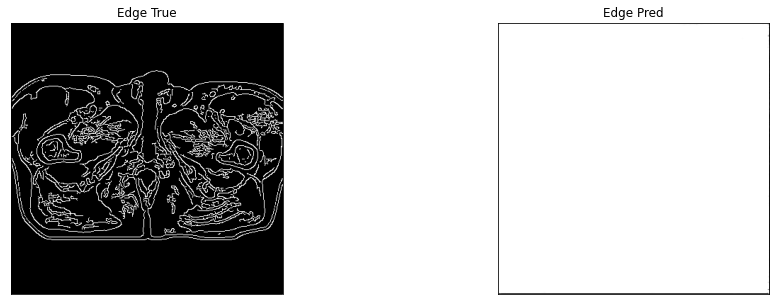

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


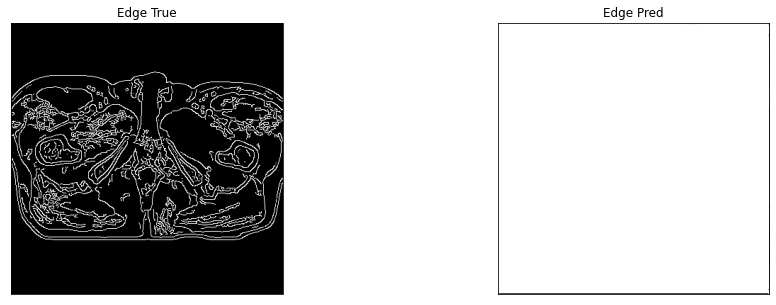

7it [00:16,  2.30s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.7522e-05, device='cuda:0') tensor(1., device='cuda:0')


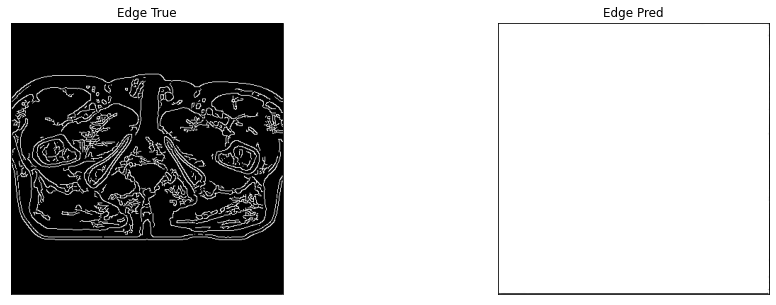

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


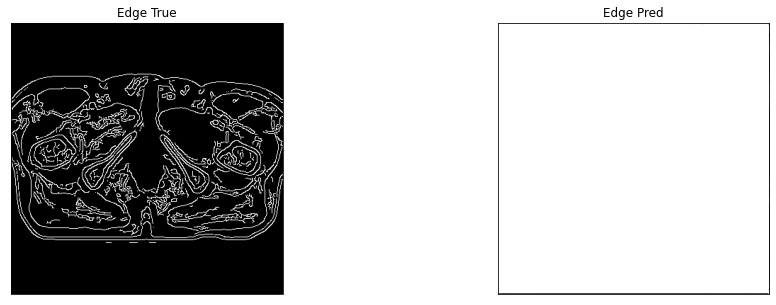

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


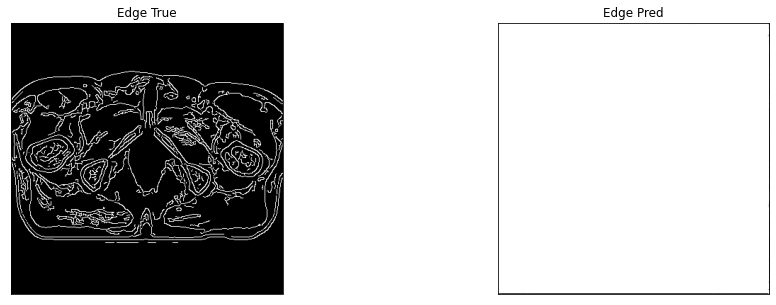

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


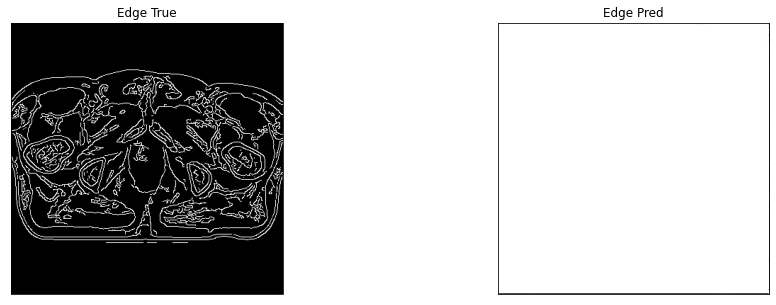

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


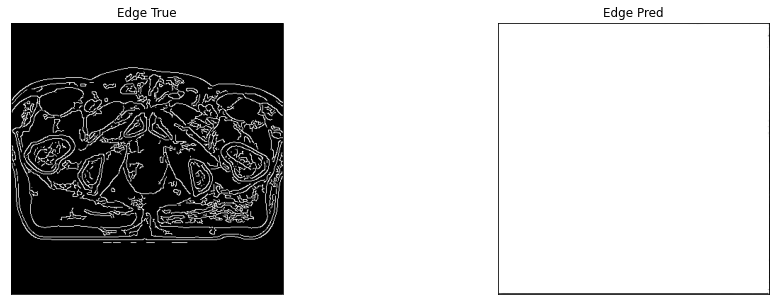

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.6750e-05, device='cuda:0') tensor(1., device='cuda:0')


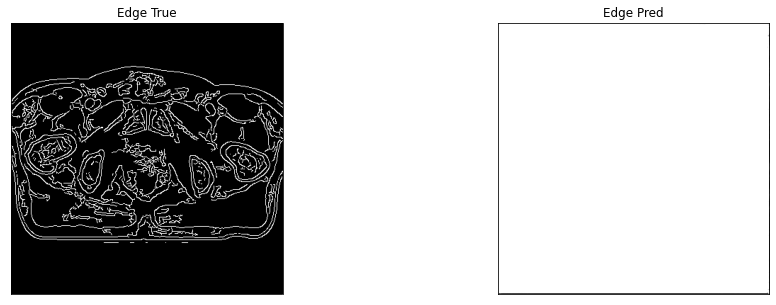

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


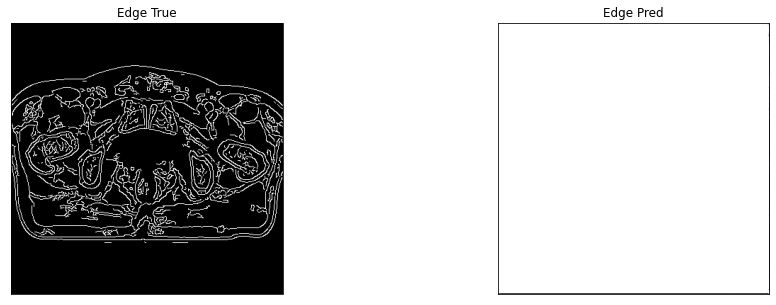

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


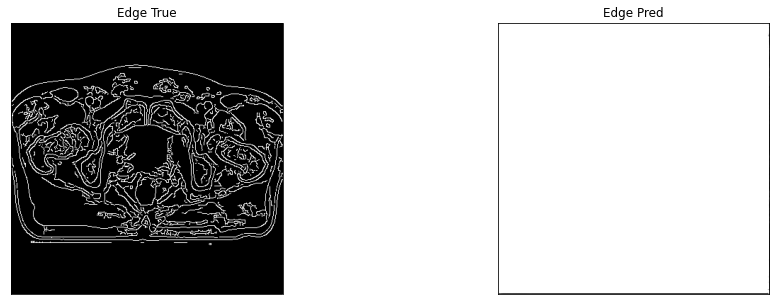

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


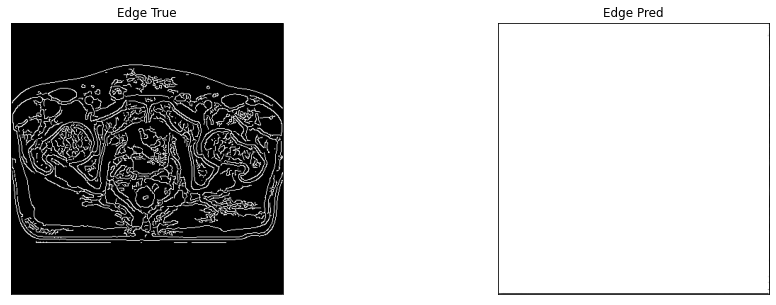

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


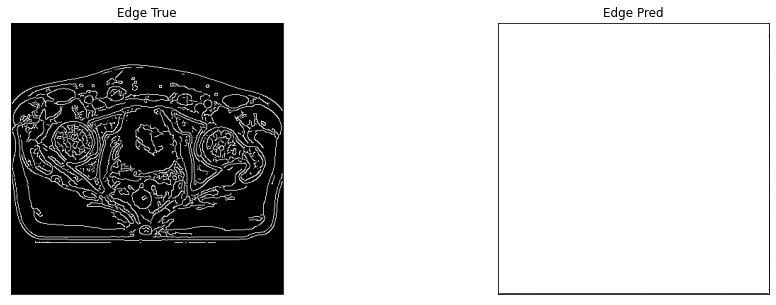

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


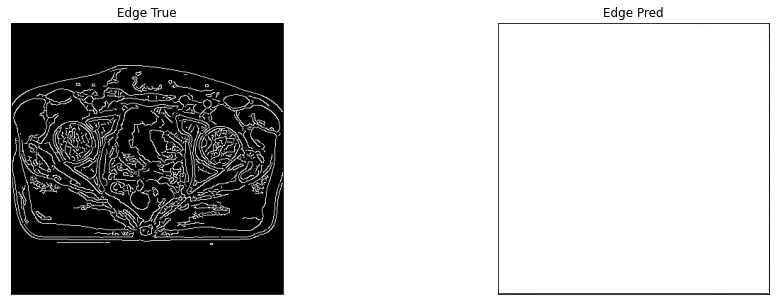

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


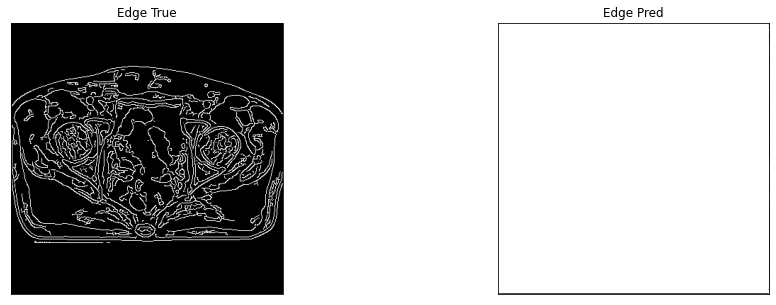

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


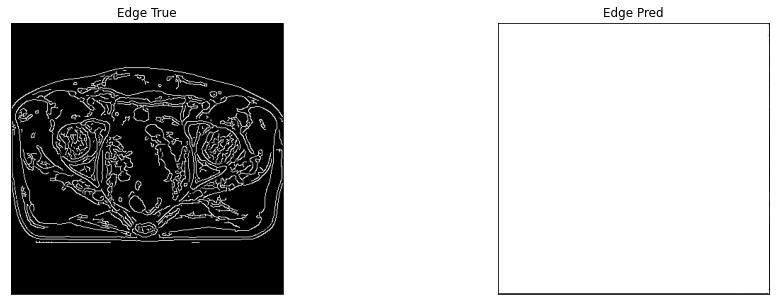

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.9440e-05, device='cuda:0') tensor(1., device='cuda:0')


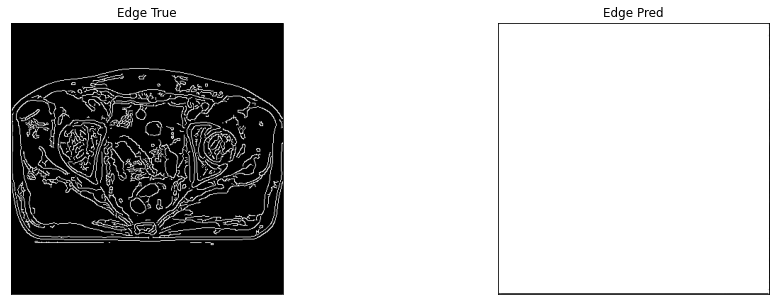

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


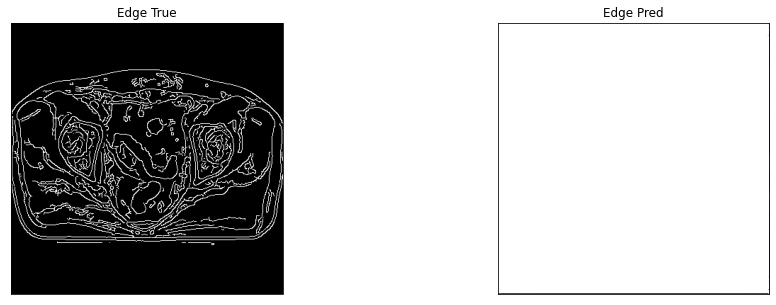

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


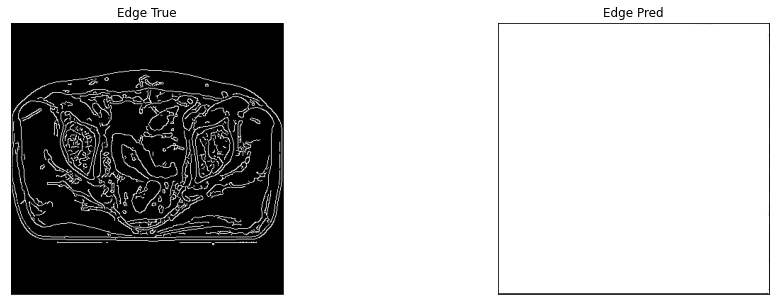

8it [00:18,  2.35s/it]

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.8053e-05, device='cuda:0') tensor(1., device='cuda:0')


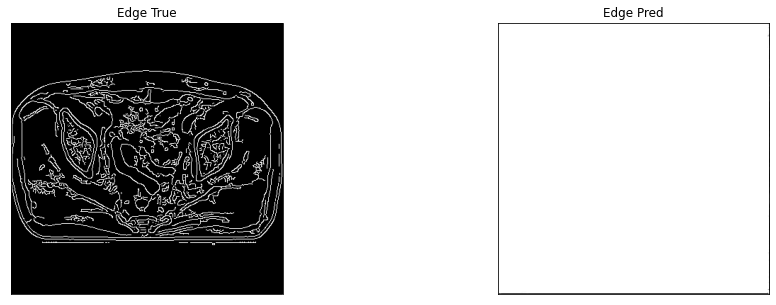

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


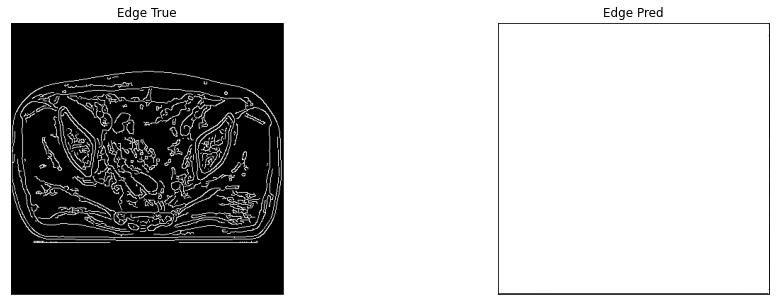

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310585379600525
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


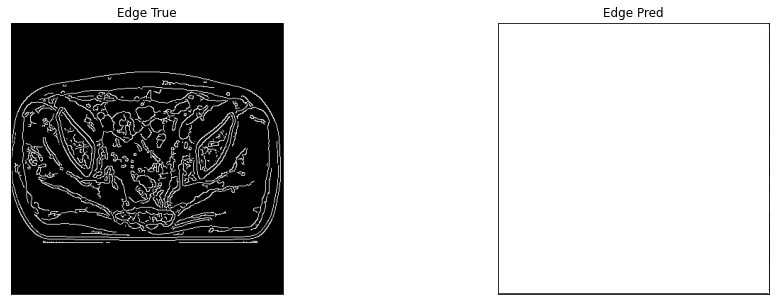

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


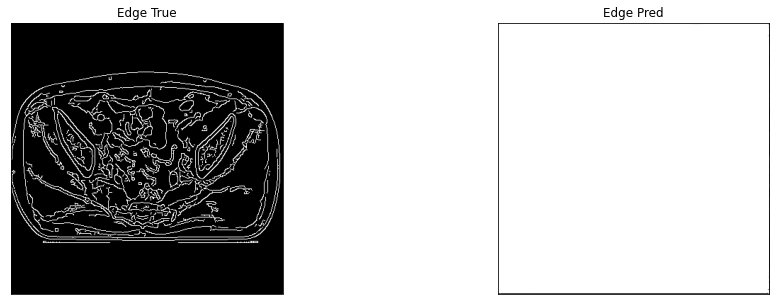

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


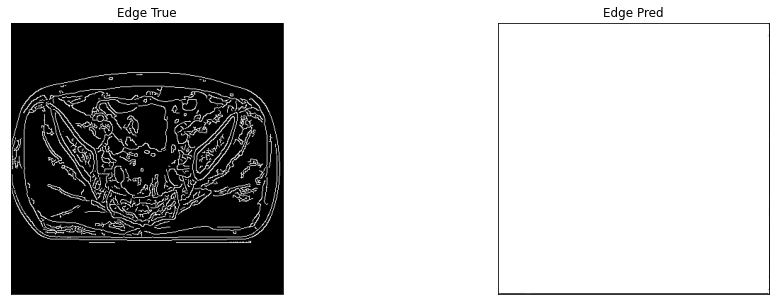

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


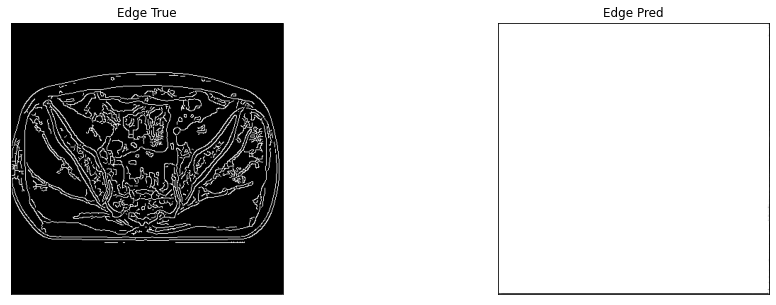

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


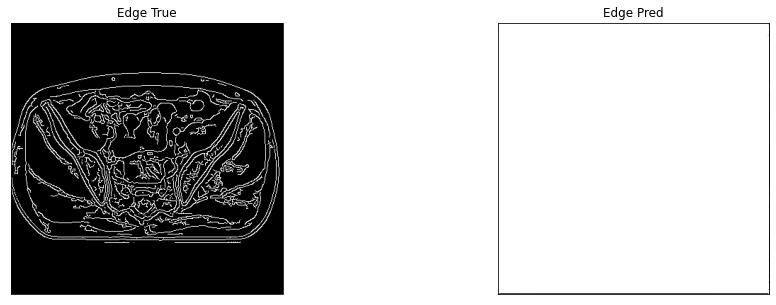

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


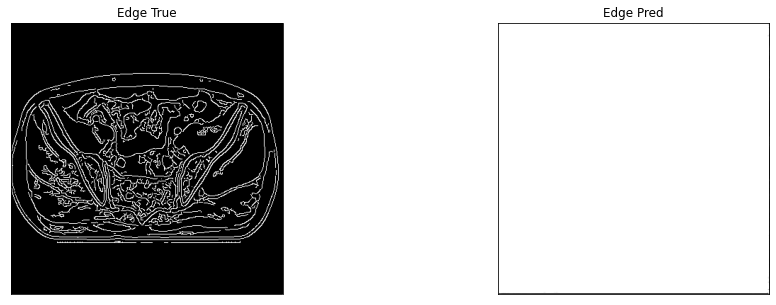

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


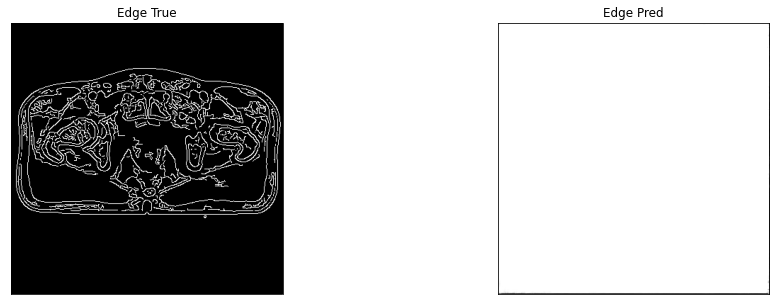

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0052, device='cuda:0') tensor(1., device='cuda:0')


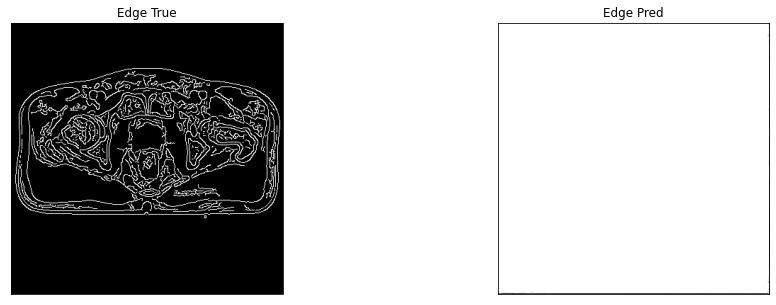

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0037, device='cuda:0') tensor(1., device='cuda:0')


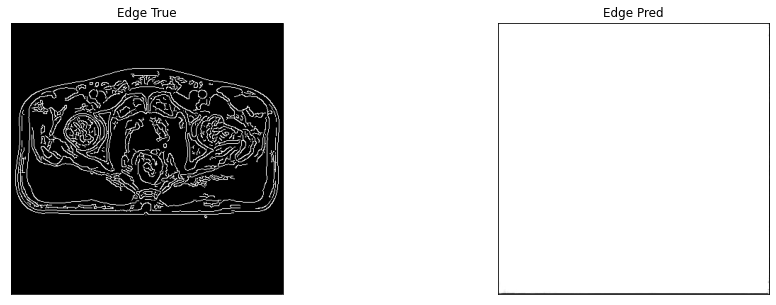

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


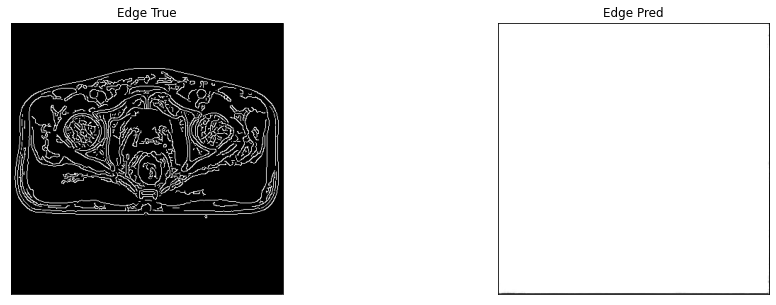

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


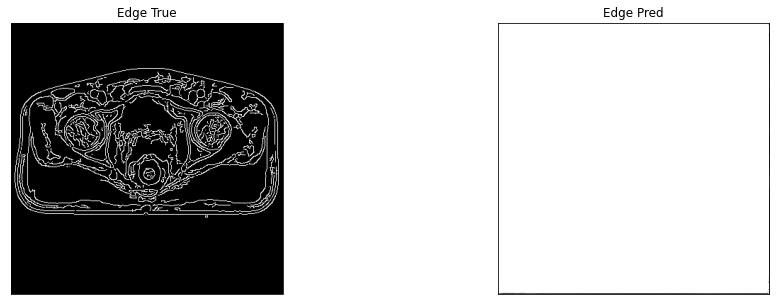

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0056, device='cuda:0') tensor(1., device='cuda:0')


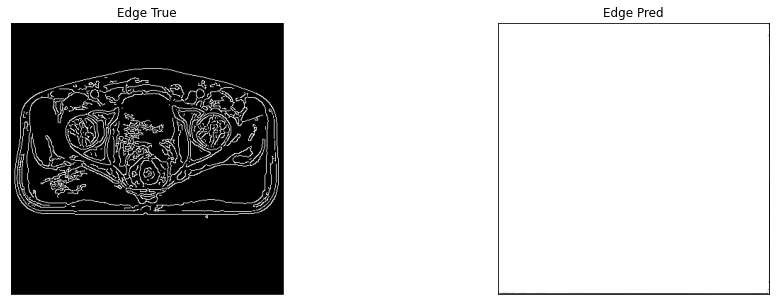

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0034, device='cuda:0') tensor(1., device='cuda:0')


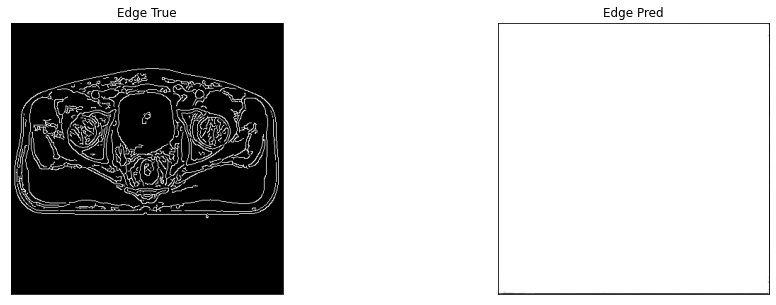

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


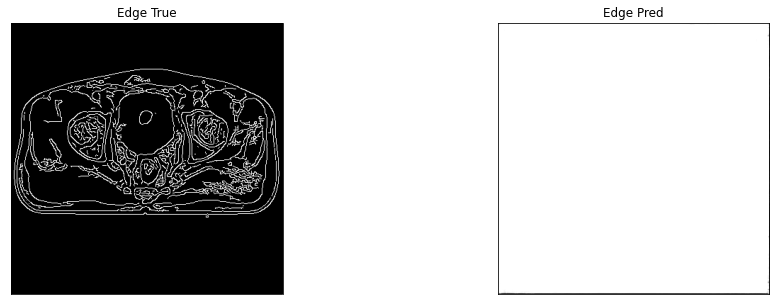

9it [00:21,  2.30s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


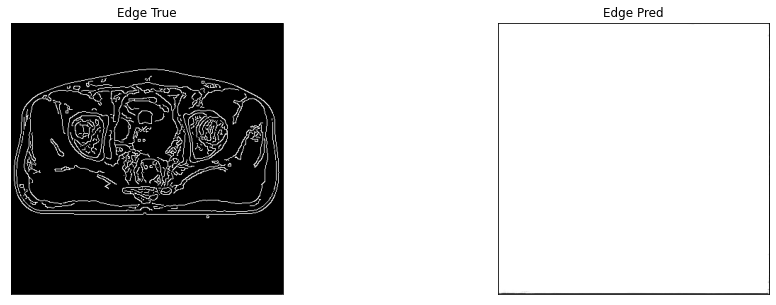

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0039, device='cuda:0') tensor(1., device='cuda:0')


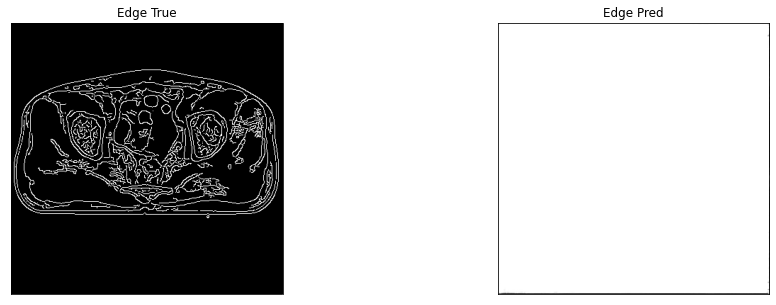

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


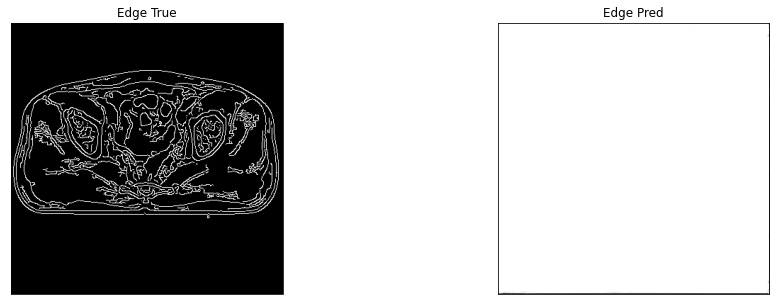

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0039, device='cuda:0') tensor(1., device='cuda:0')


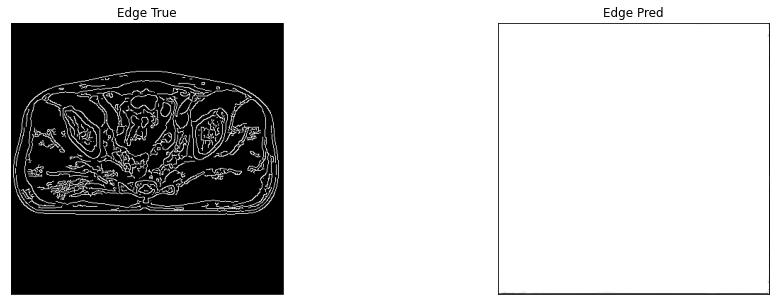

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


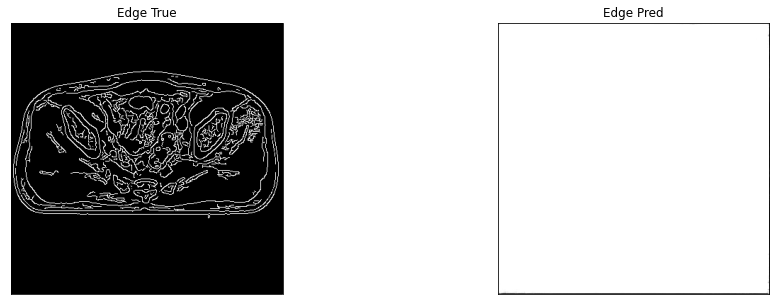

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


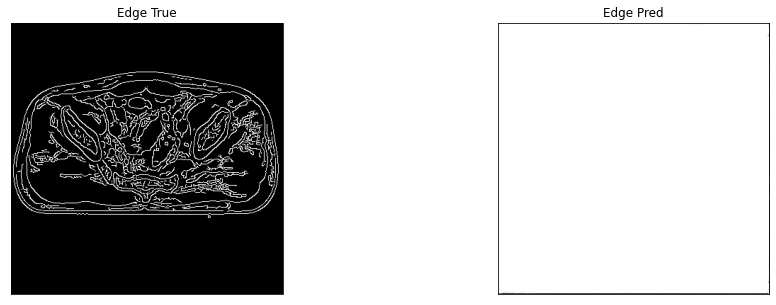

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


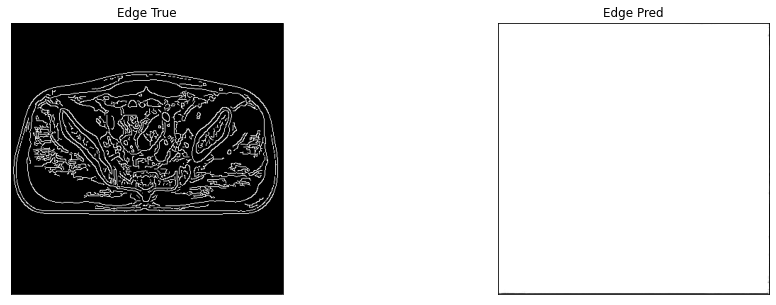

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


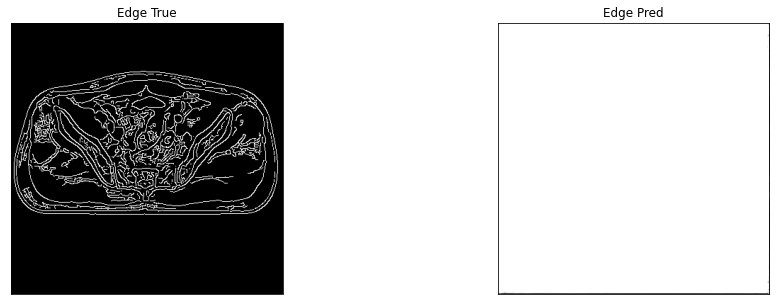

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0041, device='cuda:0') tensor(1., device='cuda:0')


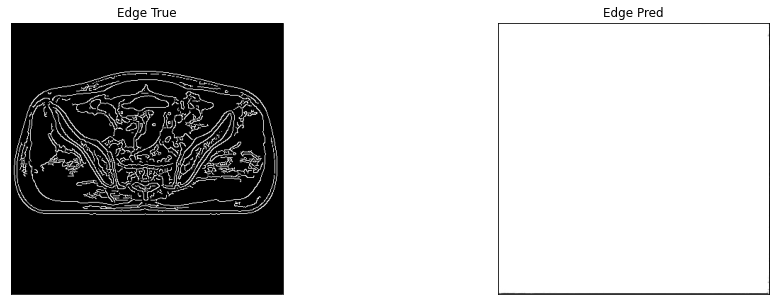

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0072, device='cuda:0') tensor(1., device='cuda:0')


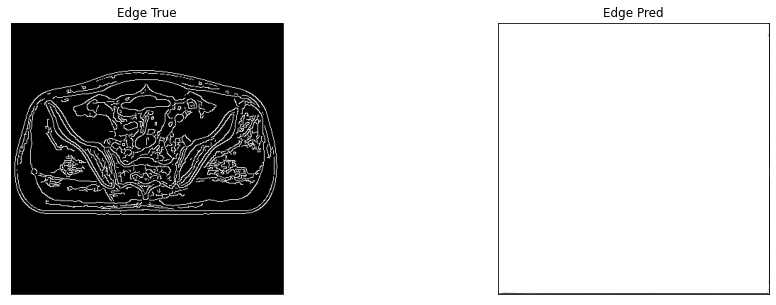

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


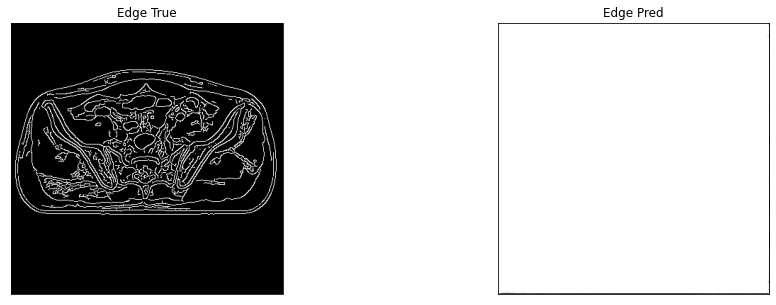

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0085, device='cuda:0') tensor(1., device='cuda:0')


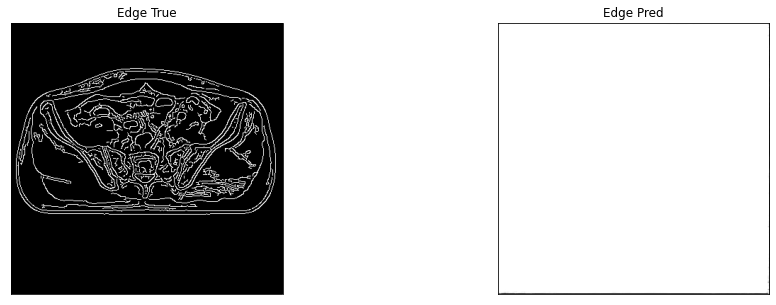

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0027, device='cuda:0') tensor(1., device='cuda:0')


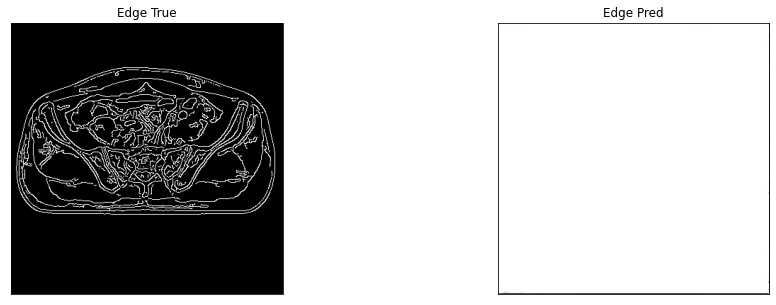

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


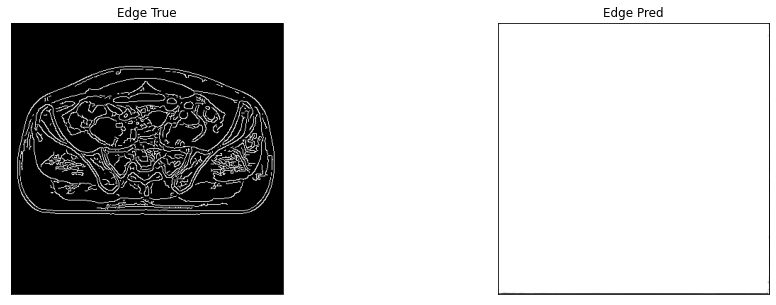

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0035, device='cuda:0') tensor(1., device='cuda:0')


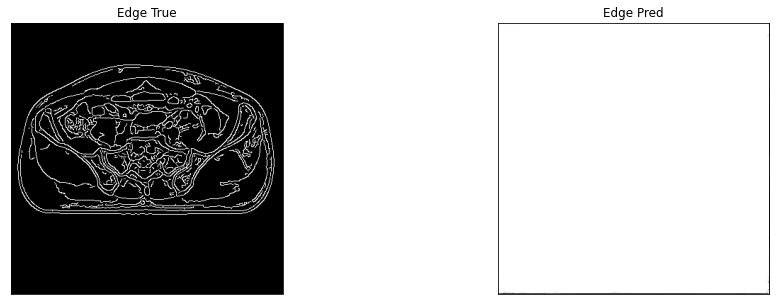

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


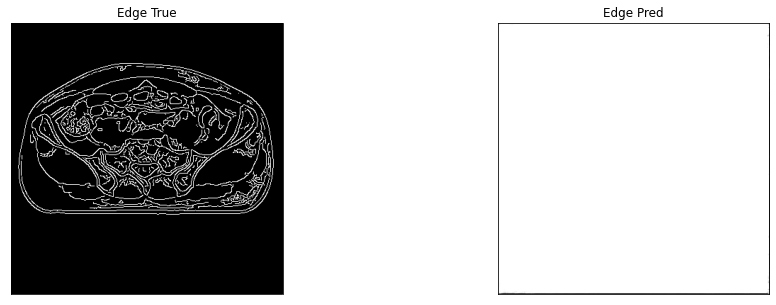

10it [00:23,  2.25s/it]

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0029, device='cuda:0') tensor(1., device='cuda:0')


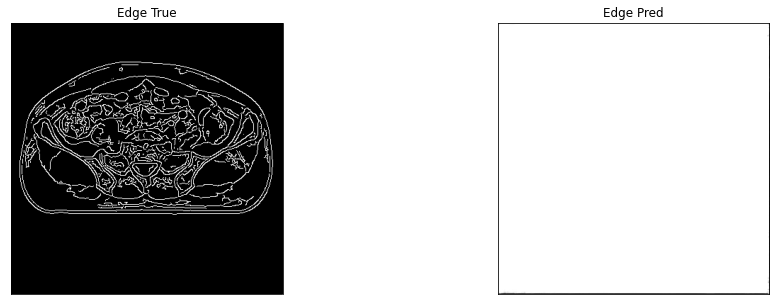

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0039, device='cuda:0') tensor(1., device='cuda:0')


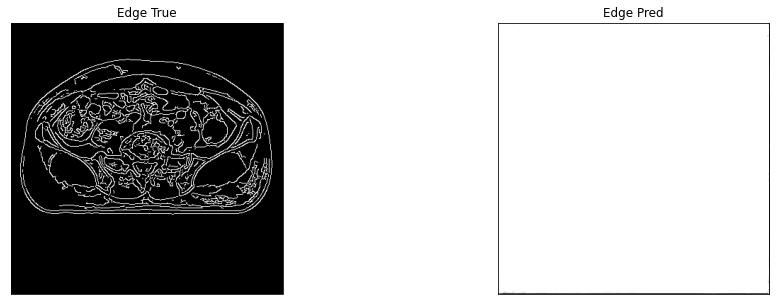

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


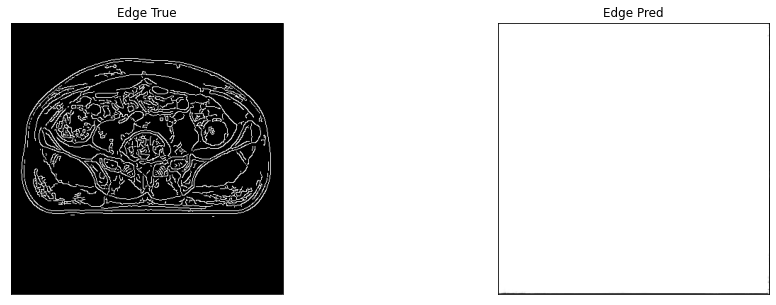

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


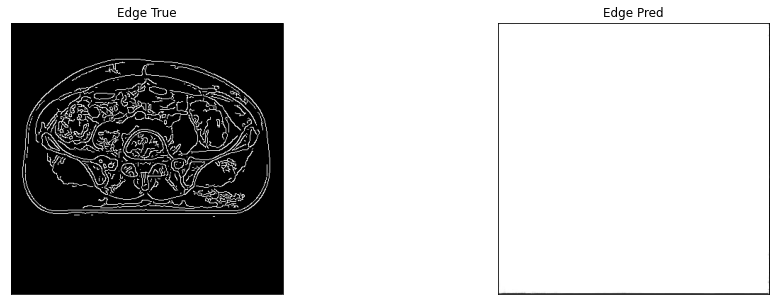

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0037, device='cuda:0') tensor(1., device='cuda:0')


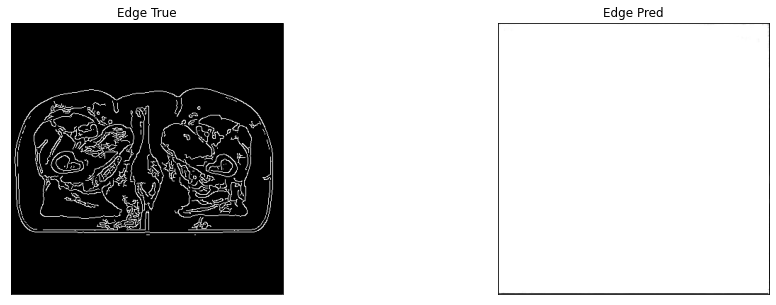

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584187507629
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


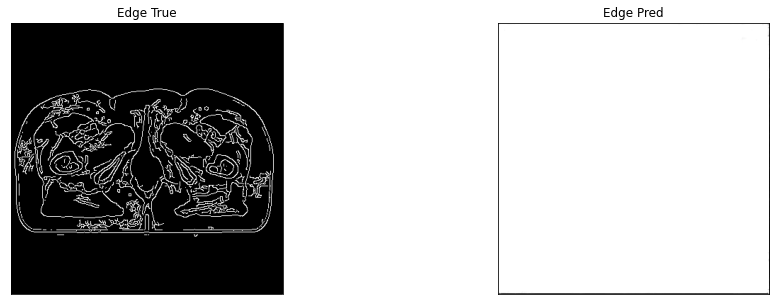

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


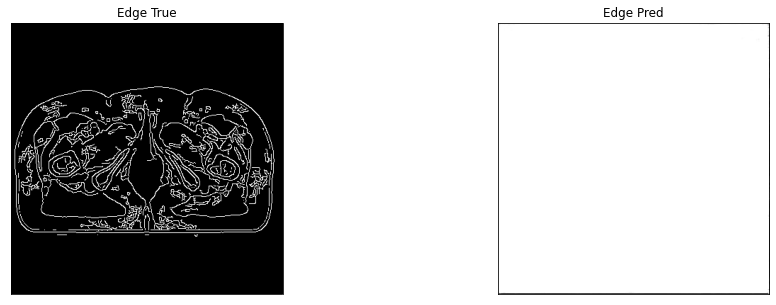

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


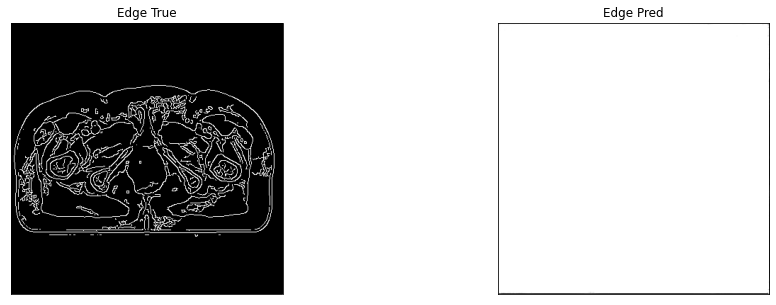

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


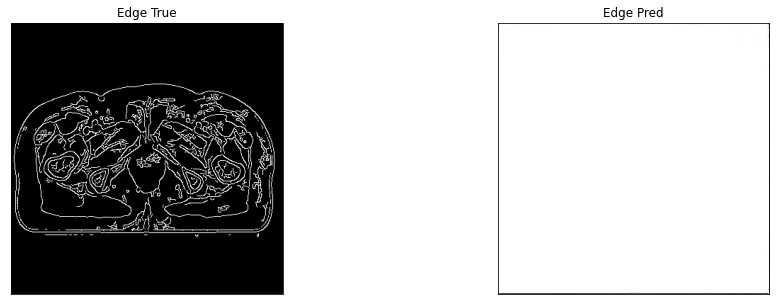

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0012, device='cuda:0') tensor(1., device='cuda:0')


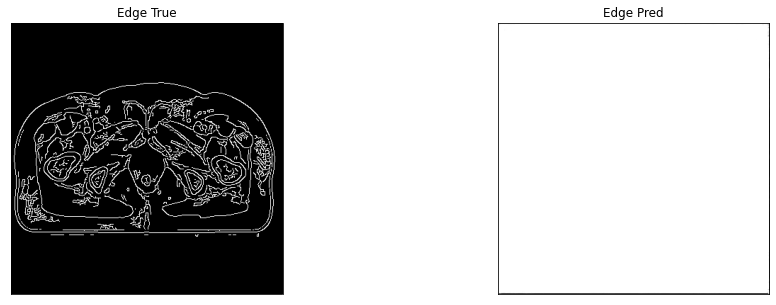

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


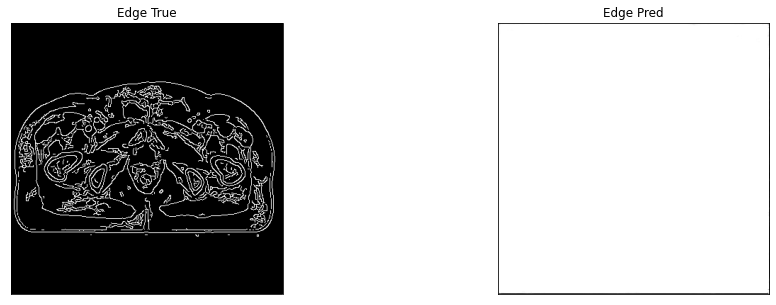

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0016, device='cuda:0') tensor(1., device='cuda:0')


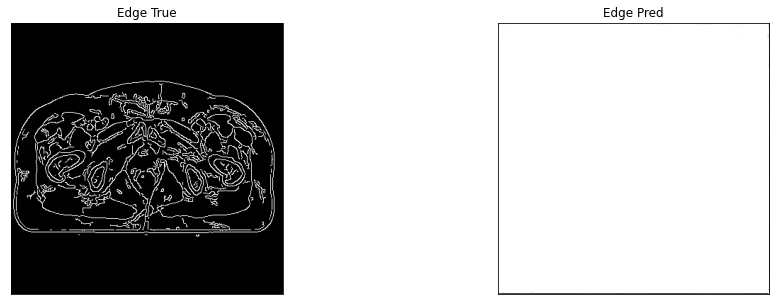

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


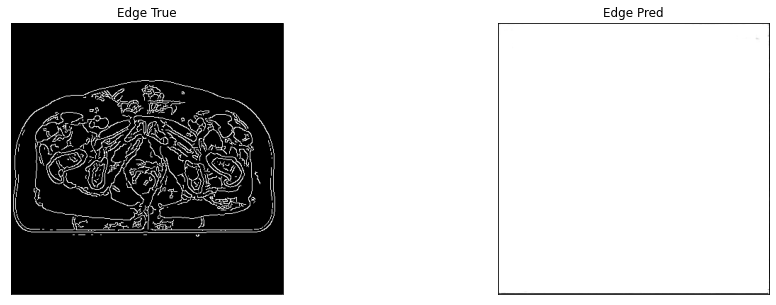

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


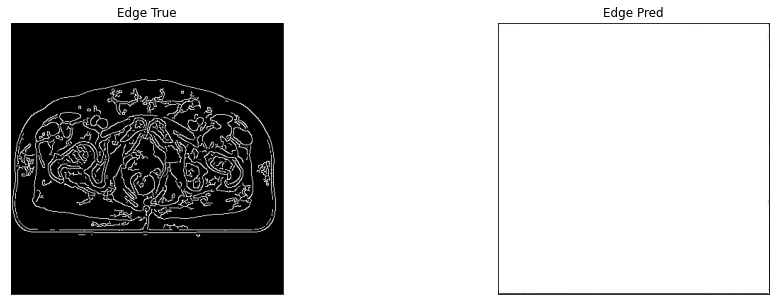

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


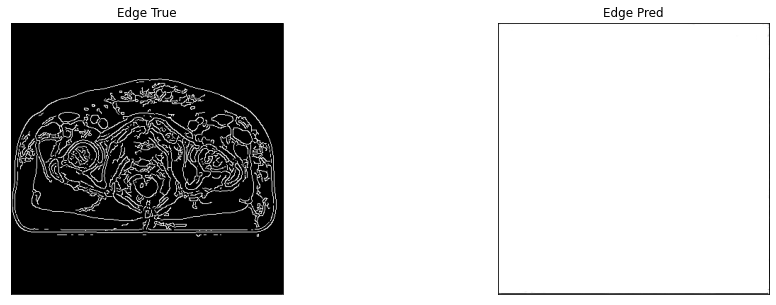

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


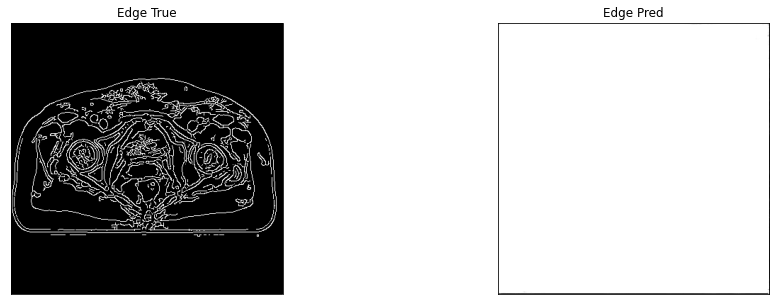

11it [00:25,  2.30s/it]

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


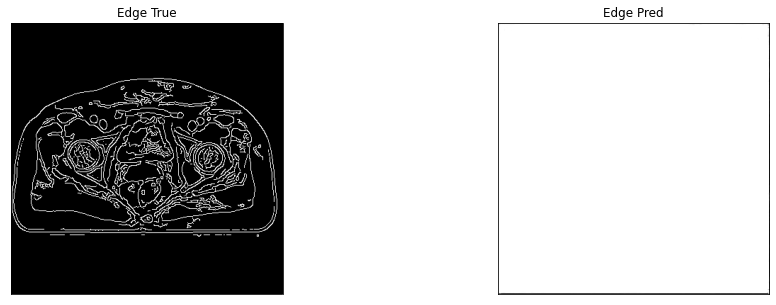

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


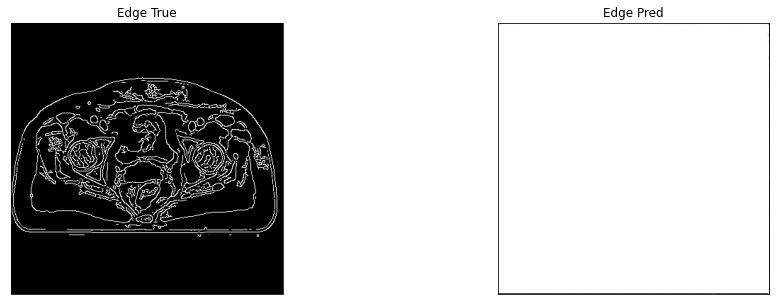

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


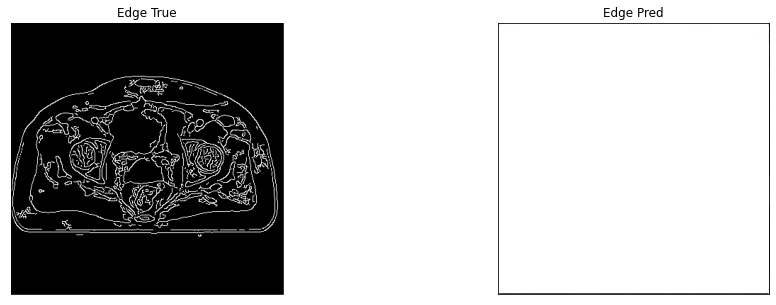

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0011, device='cuda:0') tensor(1., device='cuda:0')


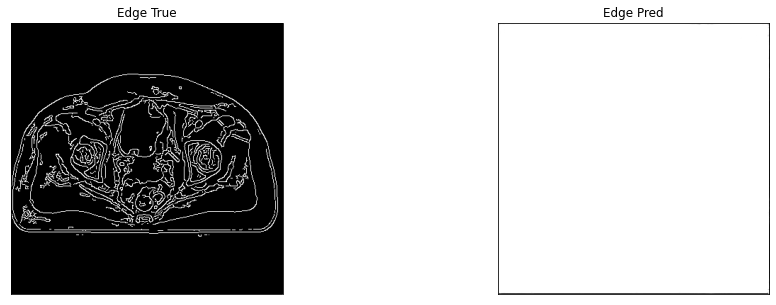

edge of ct_pred = 0.5000014305114746, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


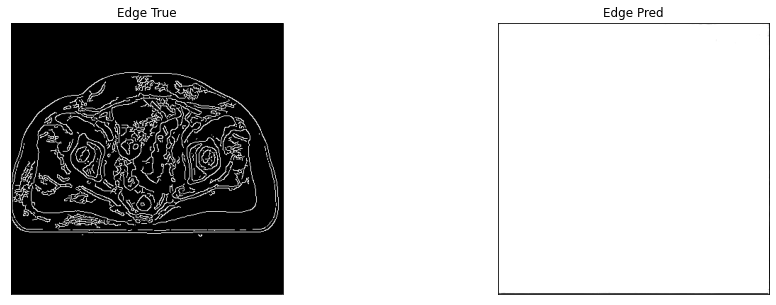

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


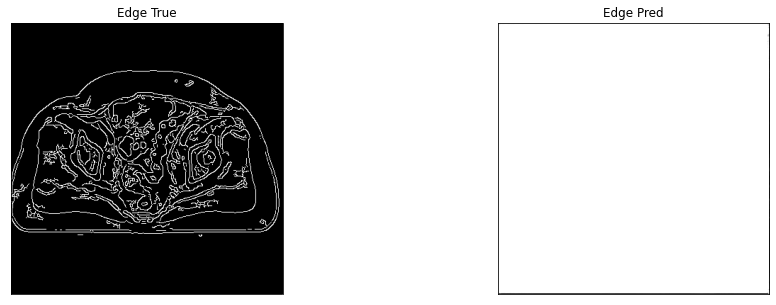

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0018, device='cuda:0') tensor(1., device='cuda:0')


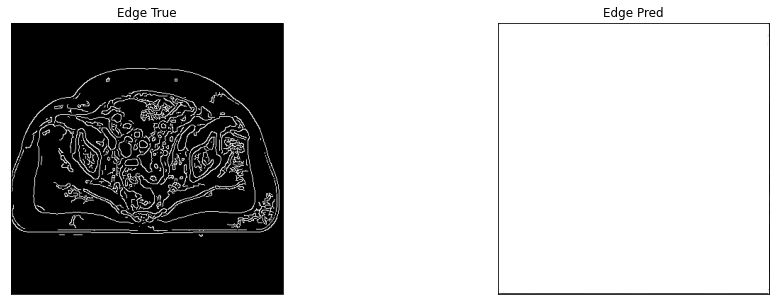

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


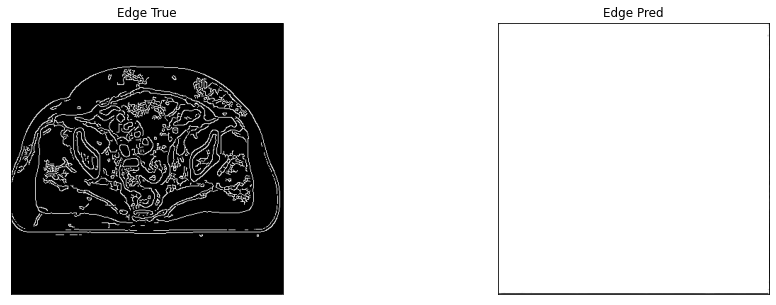

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


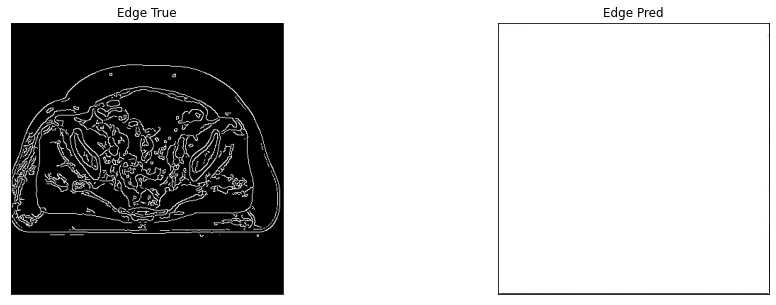

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


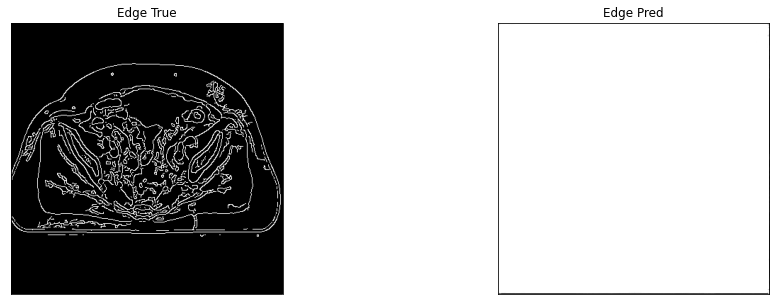

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


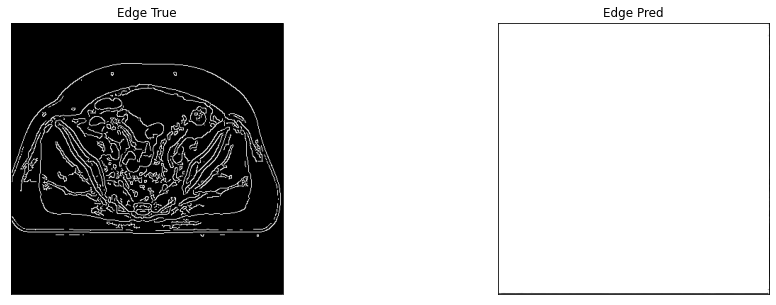

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


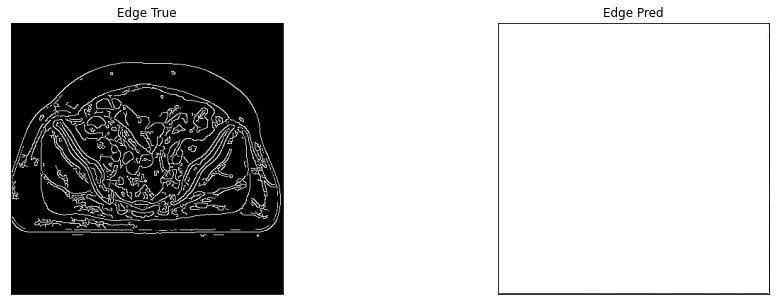

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


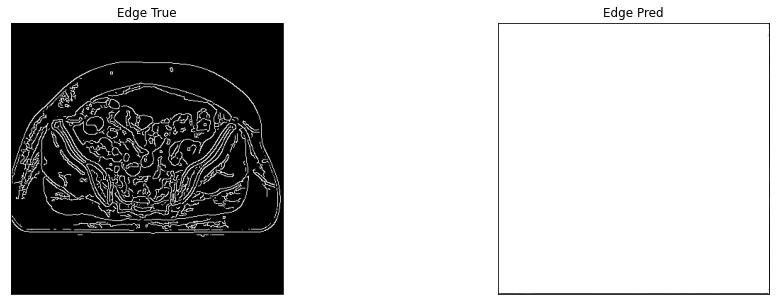

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0007, device='cuda:0') tensor(1., device='cuda:0')


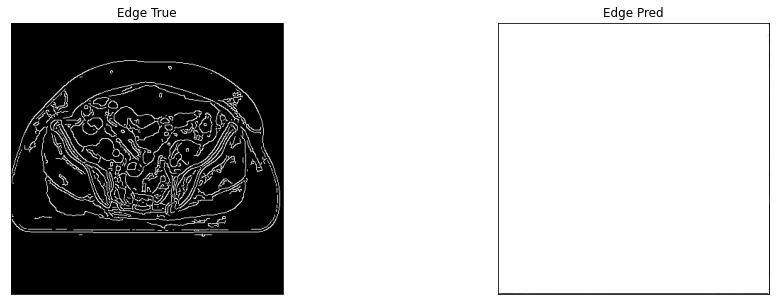

edge of ct_pred = 0.5000013709068298, edge of ct_true = 0.7310584783554077
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


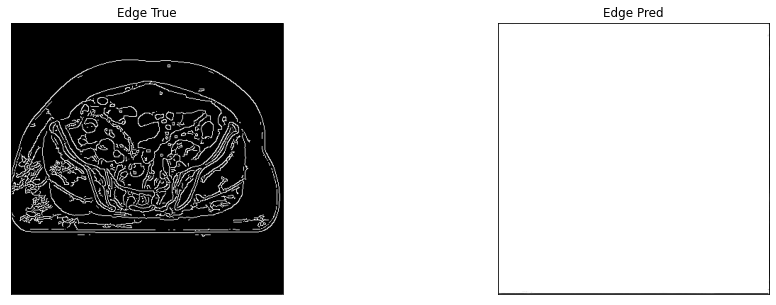

12it [00:27,  2.32s/it]


In [44]:
test_epoch(model, testloader, device, True, dir_path)

In [37]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [38]:
discriminator.load_state_dict(checkpoint["dicriminator"])

<All keys matched successfully>

In [39]:
# score_ssim_test, score_psnr_test, score_snr_test, score_mae_test, score_mask_test, score_acc_test 
# unmasked
eval_epoch(model, discriminator, testloader, device)

12it [00:05,  2.26it/s]


0.5

In [40]:
# import torchvision.models as models
# models.vgg16(pretrained=True)